# Определение пути движения спортсмена


In [ ]:
!pip install --upgrade -q pip mediapipe

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.1/36.1 MB 24.0 MB/s eta 0:00:00


In [ ]:
# Подключение Google Диска
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Поза ориентира (облегченная)
!wget -O pose_landmarker_lite.task -q https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_lite/float16/latest/pose_landmarker_lite.task

In [ ]:
#Поза ориентира (тяжелая)
!wget -O pose_landmarker_heavy.task -q https://storage.googleapis.com/mediapipe-models/pose_landmarker/pose_landmarker_heavy/float16/latest/pose_landmarker_heavy.task

In [ ]:
# Исходяшее видео
video_output_1 = '/content/drive/My Drive/video/HEIAN_NIDAN_camera_1_120s_ffmpeg.mp4'
video_output_2 = '/content/drive/My Drive/video/HEIAN_NIDAN_camera_2_120s_ffmpeg.mp4'
video_output_3 = '/content/drive/My Drive/video/HEIAN_NIDAN_camera_3_120s_ffmpeg.mp4'
video_output_4 = '/content/drive/My Drive/video/HEIAN_NIDAN_camera_4_120s_ffmpeg.mp4'

output_video_list =[video_output_1, video_output_2, video_output_3, video_output_4]

In [ ]:
import subprocess
import json
from moviepy.editor import VideoFileClip

# Функция для получения информации о кодеке с помощью ffprobe
def get_video_codec(video_path):
    command = [
        'ffprobe',
        '-v', 'error',
        '-select_streams', 'v:0',
        '-show_entries', 'stream=codec_name',
        '-of', 'json',
        video_path
    ]
    result = subprocess.run(command, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    info = json.loads(result.stdout)
    codec = info['streams'][0]['codec_name'] if 'streams' in info and len(info['streams']) > 0 else 'Unknown'
    return codec

# Функция для вывода информации о видео
def print_video_info(video_paths):
    for video_path in video_paths:
        with VideoFileClip(video_path) as video:
            codec = get_video_codec(video_path)
            duration = video.duration
            fps = video.fps
            frame_count = int(fps * duration)  # Количество кадров

            print(f"Video: {video_path}")
            print(f"  Duration: {duration} seconds")
            print(f"  FPS: {fps}")
            print(f"  Frame Count: {frame_count}")  # Вывод количества кадров
            print(f"  Resolution: {video.size[0]}x{video.size[1]}")
            print(f"  Codec: {codec}")
            print()

# Вызов функции
print_video_info(output_video_list)

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_1_120s_ffmpeg.mp4
  Duration: 120.03 seconds
  FPS: 30.0
  Frame Count: 3600
  Resolution: 2224x1080
  Codec: h264

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_2_120s_ffmpeg.mp4
  Duration: 120.0 seconds
  FPS: 29.83
  Frame Count: 3579
  Resolution: 1920x1080
  Codec: h264

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_3_120s_ffmpeg.mp4
  Duration: 120.02 seconds
  FPS: 30.0
  Frame Count: 3600
  Resolution: 1920x1080
  Codec: h264

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_4_120s_ffmpeg.mp4
  Duration: 120.02 seconds
  FPS: 30.0
  Frame Count: 3600
  Resolution: 1920x1080
  Codec: h264



In [ ]:
#@title Отрисовка 3D скелета с привязкой к изображению

from google.colab import drive
import cv2
import mediapipe as mp
import numpy as np
import pandas as pd
from google.colab.patches import cv2_imshow
from mediapipe.framework.formats import landmark_pb2
import matplotlib.pyplot as plt


import subprocess
import os
from base64 import b64encode
from IPython.display import HTML
from tqdm import tqdm

import subprocess
import json
from moviepy.editor import VideoFileClip

  if event.key is 'enter':



In [ ]:
#@title Отрисовка в 3D скелета

def pose_detection_video(video_patch, models, pose_detection, pose_presence, tracking):
    video_drive_pose = f'{video_patch}_pose_{models}_{pose_detection}_{pose_presence}_{tracking}.mp4'

    BaseOptions = mp.tasks.BaseOptions
    PoseLandmarker = mp.tasks.vision.PoseLandmarker
    PoseLandmarkerOptions = mp.tasks.vision.PoseLandmarkerOptions
    VisionRunningMode = mp.tasks.vision.RunningMode

    options = PoseLandmarkerOptions(
        base_options=BaseOptions(model_asset_path=models),
        running_mode=VisionRunningMode.VIDEO,
        min_pose_detection_confidence=pose_detection,
        min_pose_presence_confidence=pose_presence,
        min_tracking_confidence=tracking,
    )

    def draw_skeleton_on_image(rgb_image, detection_result):
        pose_landmarks_list = detection_result.pose_landmarks
        annotated_image = np.copy(rgb_image)

        for idx in range(len(pose_landmarks_list)):
            pose_landmarks = pose_landmarks_list[idx]

            # Рисуем линии между ключевыми точками
            for connection in mp.solutions.pose.POSE_CONNECTIONS:
                start_idx, end_idx = connection
                start_landmark = pose_landmarks[start_idx]
                end_landmark = pose_landmarks[end_idx]

                # Преобразуем нормализованные координаты в пиксели
                h, w, _ = annotated_image.shape
                start_point = (int(start_landmark.x * w), int(start_landmark.y * h))
                end_point = (int(end_landmark.x * w), int(end_landmark.y * h))

                # Рисуем линию
                cv2.line(annotated_image, start_point, end_point, (0, 255, 0), 2)  # Зеленый цвет

            # Рисуем точки скелета красным цветом
            for landmark in pose_landmarks:
                point = (int(landmark.x * w), int(landmark.y * h))
                cv2.circle(annotated_image, point, 5, (255, 0, 0), -1)  # Красный цвет

        return annotated_image

    cap = cv2.VideoCapture(video_patch)

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(video_drive_pose, fourcc, 30, (width, height))

    # Создаем список для хранения координат
    landmarks_data = []

    with PoseLandmarker.create_from_options(options) as landmarker:
        for frame_number in tqdm(range(total_frames), desc="Processing frames"):
            success, frame = cap.read()
            if not success:
                break  # Выход из цикла, если кадры закончились

            frame_timestamp_ms = int(cap.get(cv2.CAP_PROP_POS_MSEC))
            mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=frame)

            detection_result = landmarker.detect_for_video(mp_image, frame_timestamp_ms)

            if detection_result:  # Проверяем, есть ли обнаруженные позы
                #print('Поза обнаружена', detection_result)

                    # Создаем белое изображение того же размера
                white_image = np.ones((height, width, 3), dtype=np.uint8) * 255
                annotated_image = draw_skeleton_on_image(white_image, detection_result)

                    # Сохраняем координаты в список
                pose_landmarks_list = detection_result.pose_landmarks
                for idx, pose_landmarks in enumerate(pose_landmarks_list):
                    for landmark_id, landmark in enumerate(pose_landmarks):
                        x_pixel = int(landmark.x * width)
                        y_pixel = int(landmark.y * height)
                        landmarks_data.append({'frame': frame_number, 'landmark_id': landmark_id, 'x': x_pixel, 'y': y_pixel})

                    # Отображение аннотированного изображения на графике
                # Обработка только кадров с 142 по 147
                if 1670 <= frame_number <= 1675:
                    plt.figure(figsize=(width / 100, height / 100), dpi=100)
                    plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
                    plt.axis('on')  # Включаем оси
                    plt.grid(True)  # Включаем сетку

                    # Устанавливаем диапазоны осей
                    plt.xlim(0, width)
                    plt.ylim(height, 0)  # Обратите внимание, что Y-оси инвертированы в изображениях

                    plt.show()

                out.write(annotated_image)
            else:
                out.write(frame)

    cap.release()
    out.release()

    # Создаем DataFrame из списка и сохраняем в CSV файл
    landmarks_df = pd.DataFrame(landmarks_data)
    landmarks_df.to_csv('landmarks_coordinates_4.csv', index=False)
    print("Координаты точек сохранены в 'landmarks_coordinates.csv'")

Processing frames:   4%|▍         | 142/3603 [00:11<03:48, 15.13it/s]

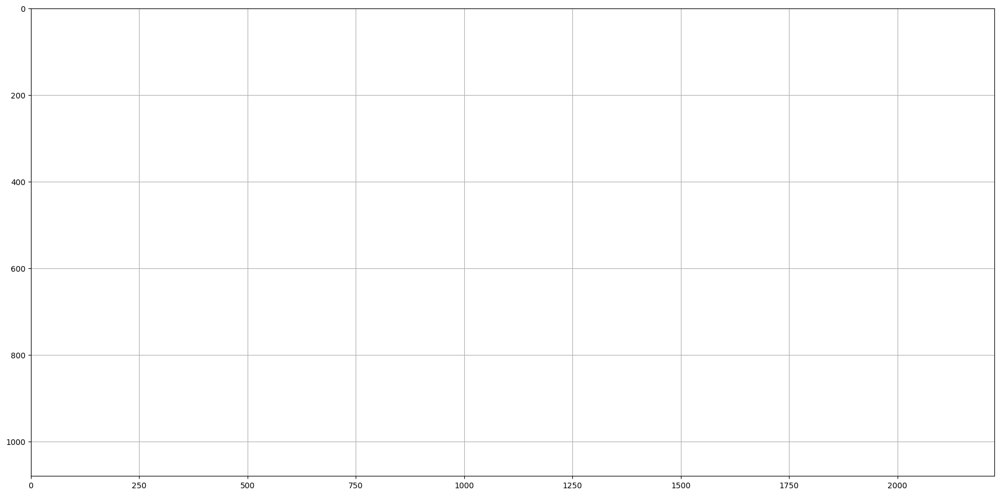

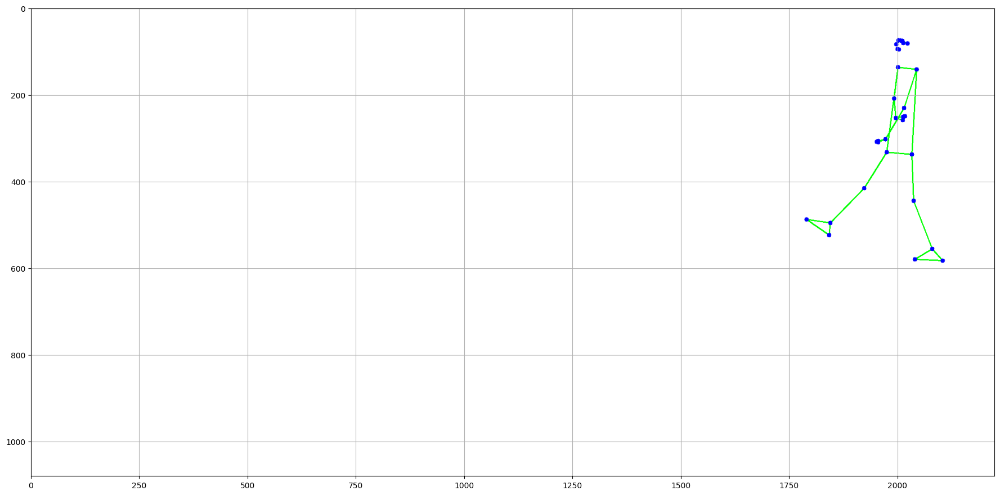

Processing frames:   4%|▍         | 144/3603 [00:13<17:57,  3.21it/s]

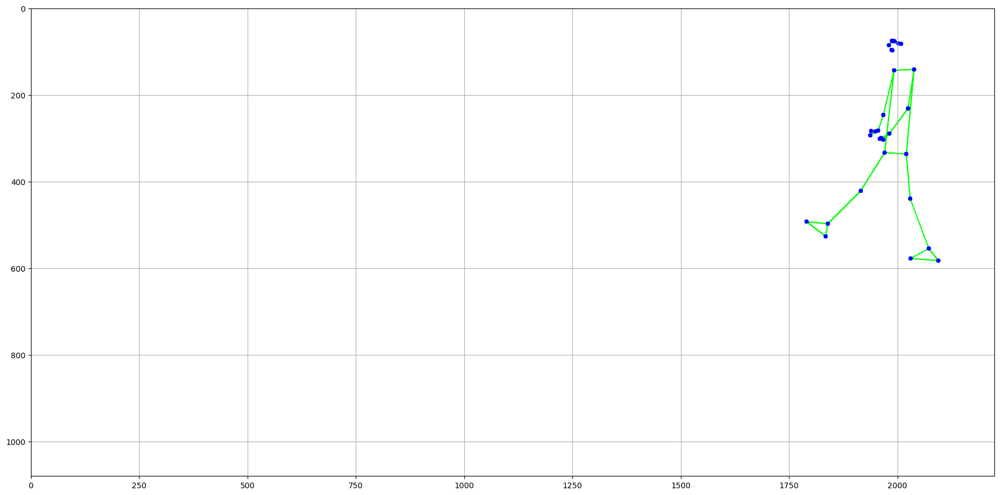

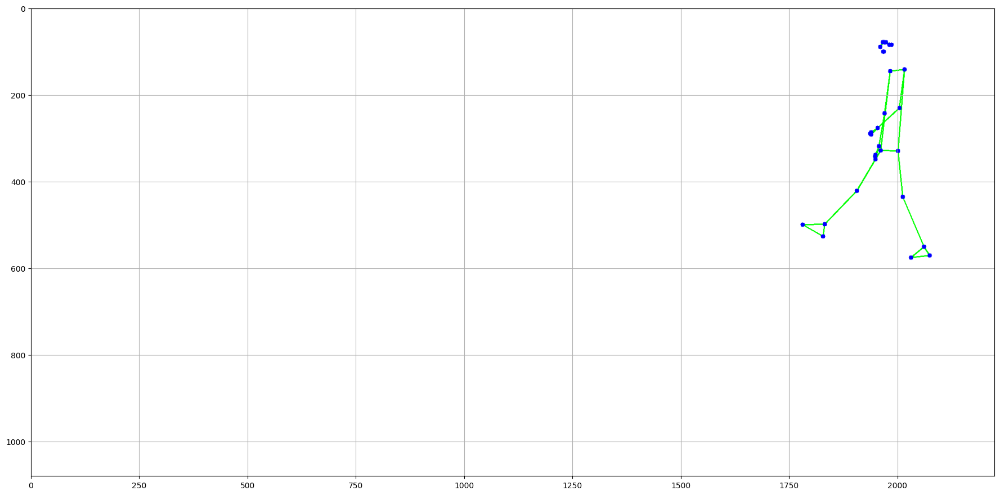

Processing frames:   4%|▍         | 146/3603 [00:15<28:16,  2.04it/s]

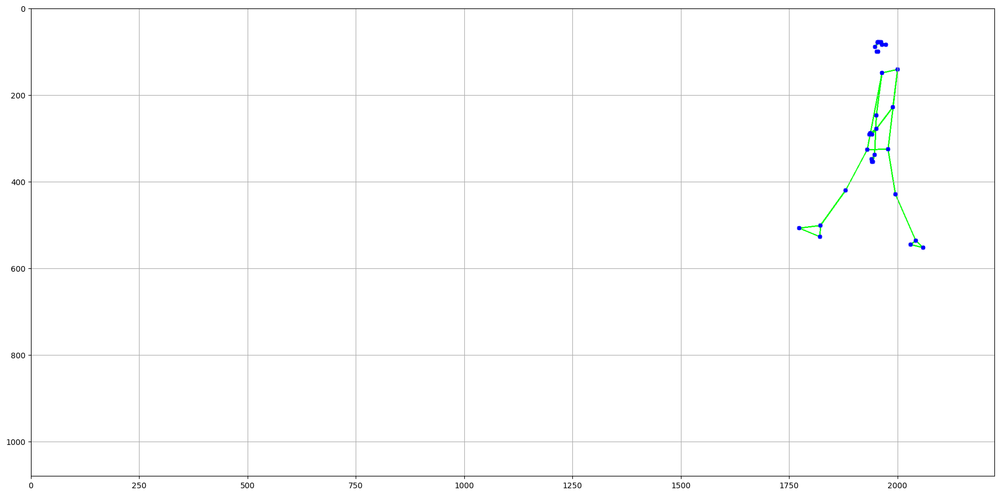

Processing frames:   4%|▍         | 147/3603 [00:16<32:33,  1.77it/s]

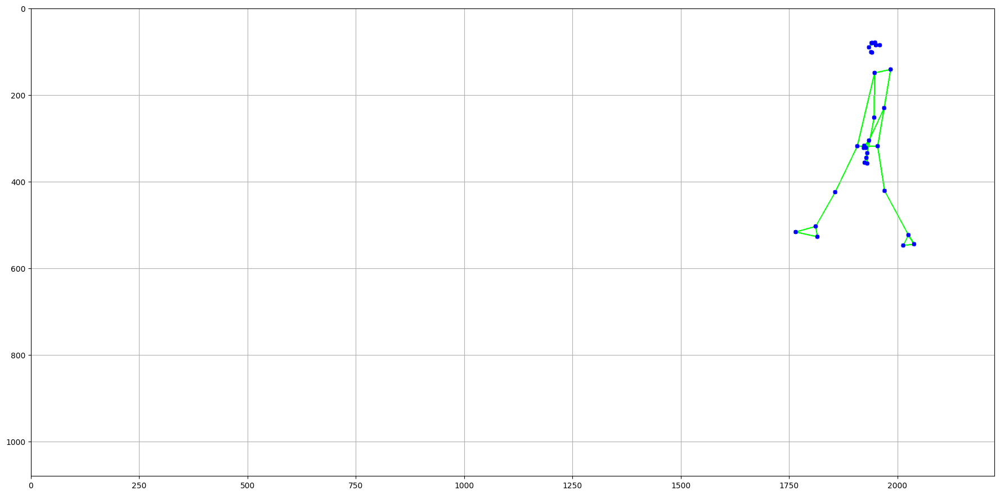

Processing frames: 100%|██████████| 3603/3603 [08:52<00:00,  6.76it/s]


Координаты точек сохранены в 'landmarks_coordinates.csv'


In [ ]:
#@title с камеры 1 (142 - 147 кадр) с привязкой к изображению и сохранение координат
pose_detection_video(video_output_1,"pose_landmarker_heavy.task",0.5,0.5,0.5)

Processing frames:  47%|████▋     | 1670/3589 [02:28<06:51,  4.67it/s]

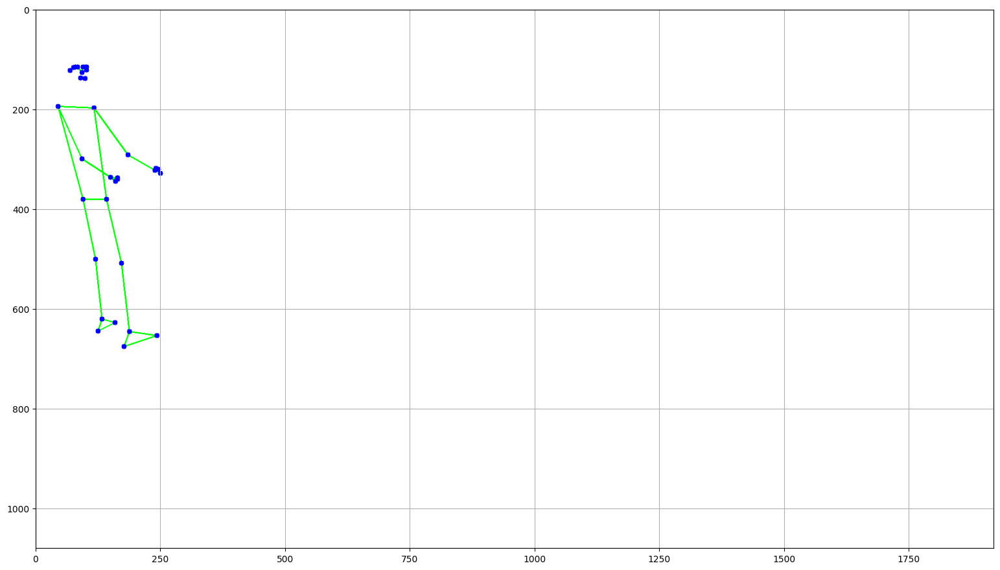

Processing frames:  47%|████▋     | 1671/3589 [02:29<17:09,  1.86it/s]

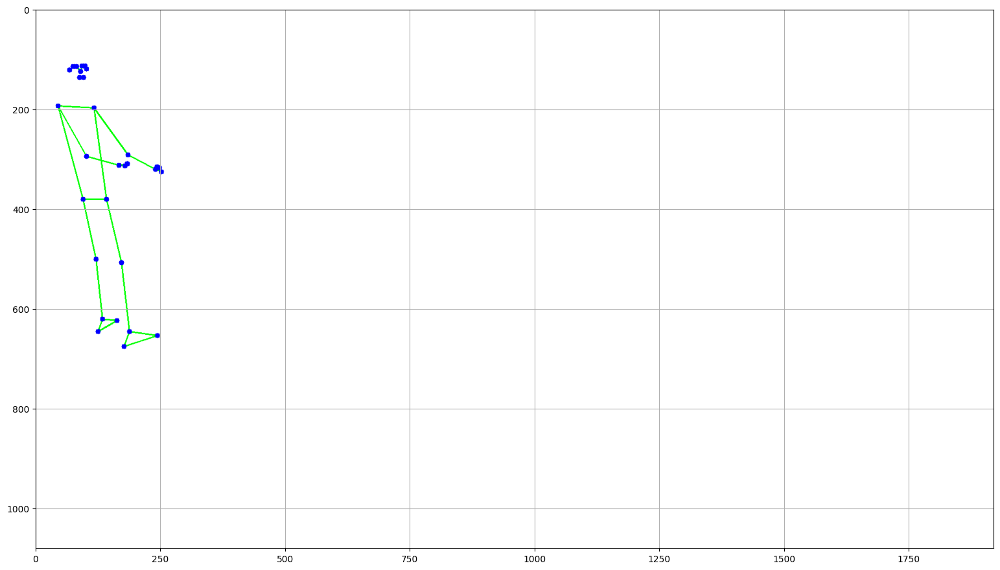

Processing frames:  47%|████▋     | 1672/3589 [02:31<24:10,  1.32it/s]

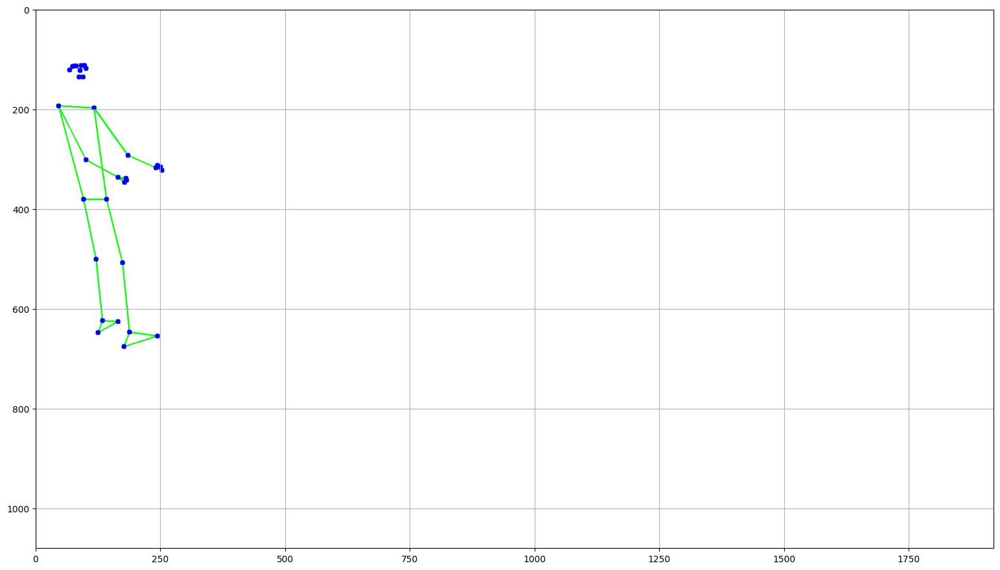

Processing frames:  47%|████▋     | 1673/3589 [02:32<28:42,  1.11it/s]

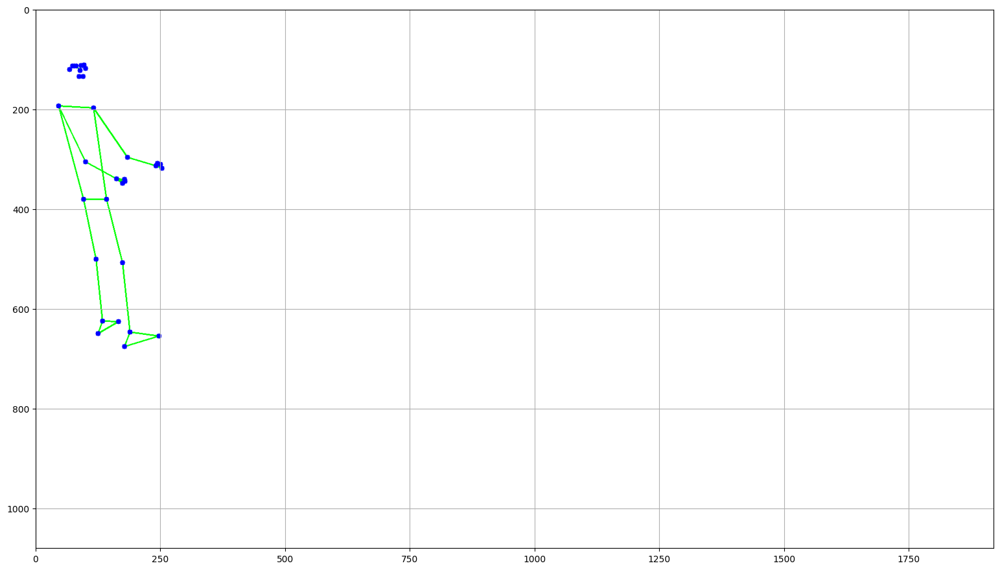

Processing frames:  47%|████▋     | 1674/3589 [02:33<30:02,  1.06it/s]

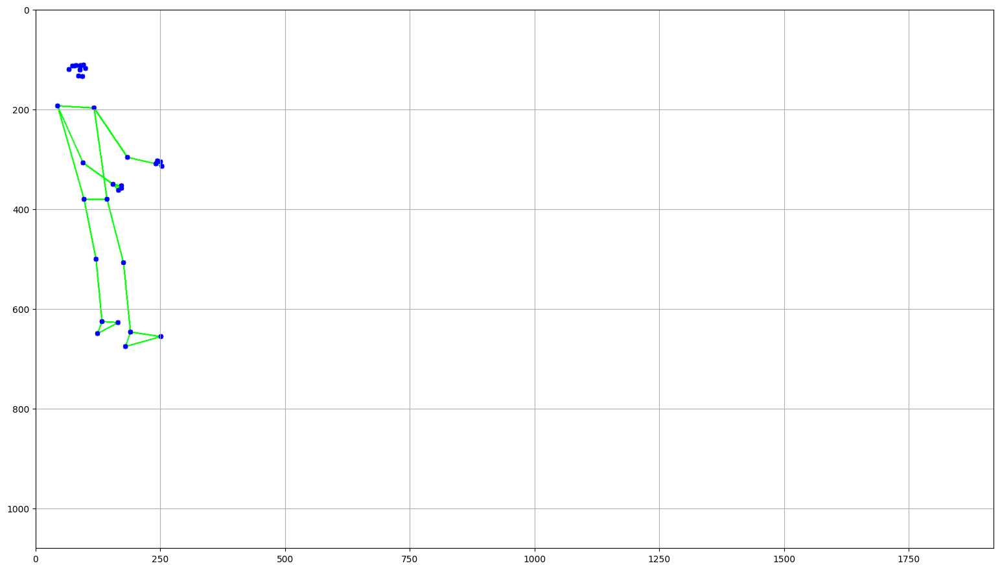

Processing frames:  47%|████▋     | 1675/3589 [02:34<28:54,  1.10it/s]

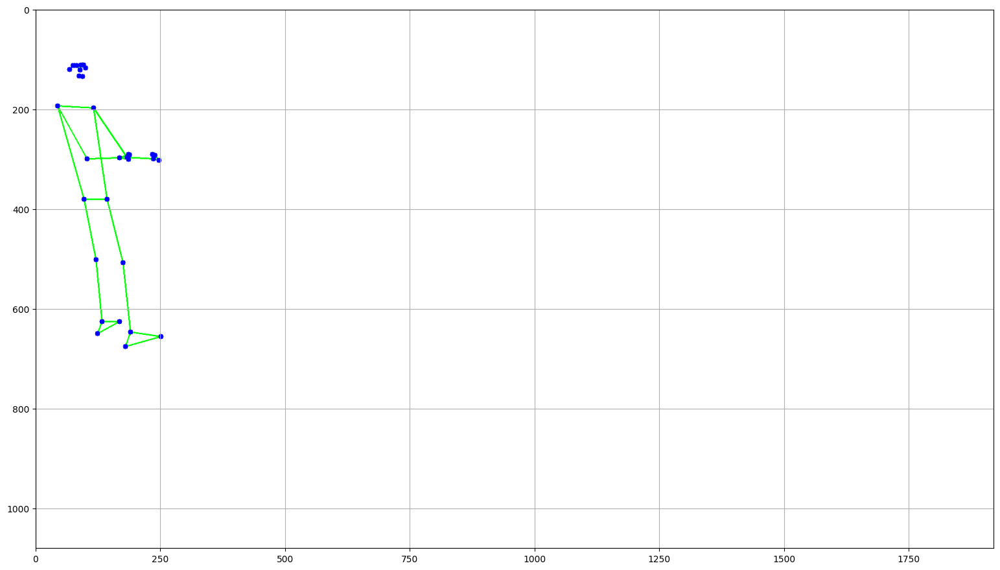

Processing frames: 100%|██████████| 3589/3589 [08:25<00:00,  7.10it/s]


Координаты точек сохранены в 'landmarks_coordinates.csv'


In [ ]:
#@title с камеры 4 (1670 - 1675 кадр) с привязкой к изображению и сохранение координат
pose_detection_video(video_output_4,"pose_landmarker_heavy.task",0.5,0.5,0.5)

In [ ]:
landmarks_df = pd.read_csv('landmarks_coordinates.csv')

In [ ]:
#Позы с камеры №1
landmarks_df

,frame,landmark_id,x,y
0,143,0,1996,84
1,143,1,2001,75
2,143,2,2002,75
3,143,3,2002,75
4,143,4,2005,75
...,...,...,...,...
59494,3602,28,1664,464
59495,3602,29,1637,494
59496,3602,30,1667,483
59497,3602,31,1582,487


#Определение ключевых точек на изображениях

In [ ]:
import subprocess
import json
from moviepy.editor import VideoFileClip

# Функция для получения информации о кодеке с помощью ffprobe
def get_video_codec(video_path):
    command = [
        'ffprobe',
        '-v', 'error',
        '-select_streams', 'v:0',
        '-show_entries', 'stream=codec_name',
        '-of', 'json',
        video_path
    ]
    result = subprocess.run(command, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    info = json.loads(result.stdout)
    codec = info['streams'][0]['codec_name'] if 'streams' in info and len(info['streams']) > 0 else 'Unknown'
    return codec

# Функция для вывода информации о видео
def print_video_info(video_paths):
    for video_path in video_paths:
        with VideoFileClip(video_path) as video:
            codec = get_video_codec(video_path)
            duration = video.duration
            fps = video.fps
            frame_count = int(fps * duration)  # Количество кадров

            print(f"Video: {video_path}")
            print(f"  Duration: {duration} seconds")
            print(f"  FPS: {fps}")
            print(f"  Frame Count: {frame_count}")  # Вывод количества кадров
            print(f"  Resolution: {video.size[0]}x{video.size[1]}")
            print(f"  Codec: {codec}")
            print()

# Вызов функции
print_video_info(output_video_list)

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_1_120s_ffmpeg.mp4
  Duration: 120.03 seconds
  FPS: 30.0
  Frame Count: 3600
  Resolution: 2224x1080
  Codec: h264

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_2_120s_ffmpeg.mp4
  Duration: 120.0 seconds
  FPS: 29.83
  Frame Count: 3579
  Resolution: 1920x1080
  Codec: h264

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_3_120s_ffmpeg.mp4
  Duration: 120.02 seconds
  FPS: 30.0
  Frame Count: 3600
  Resolution: 1920x1080
  Codec: h264

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_4_120s_ffmpeg.mp4
  Duration: 120.02 seconds
  FPS: 30.0
  Frame Count: 3600
  Resolution: 1920x1080
  Codec: h264



In [ ]:
#@title Отрисовка 3D скелета с привязкой к изображению

from google.colab import drive
import cv2
import mediapipe as mp
import numpy as np
import pandas as pd
from google.colab.patches import cv2_imshow
from mediapipe.framework.formats import landmark_pb2
import matplotlib.pyplot as plt


import subprocess
import os
from base64 import b64encode
from IPython.display import HTML
from tqdm import tqdm

import subprocess
import json
from moviepy.editor import VideoFileClip

  if event.key is 'enter':



In [ ]:
#@title Отрисовка в 3D скелета

def pose_detection_video(video_patch, models, pose_detection, pose_presence, tracking):
    video_drive_pose = f'{video_patch}_pose_{models}_{pose_detection}_{pose_presence}_{tracking}.mp4'

    BaseOptions = mp.tasks.BaseOptions
    PoseLandmarker = mp.tasks.vision.PoseLandmarker
    PoseLandmarkerOptions = mp.tasks.vision.PoseLandmarkerOptions
    VisionRunningMode = mp.tasks.vision.RunningMode

    options = PoseLandmarkerOptions(
        base_options=BaseOptions(model_asset_path=models),
        running_mode=VisionRunningMode.VIDEO,
        min_pose_detection_confidence=pose_detection,
        min_pose_presence_confidence=pose_presence,
        min_tracking_confidence=tracking,
    )

    def draw_skeleton_on_image(rgb_image, detection_result):
        pose_landmarks_list = detection_result.pose_landmarks
        annotated_image = np.copy(rgb_image)

        for idx in range(len(pose_landmarks_list)):
            pose_landmarks = pose_landmarks_list[idx]

            # Рисуем линии между ключевыми точками
            for connection in mp.solutions.pose.POSE_CONNECTIONS:
                start_idx, end_idx = connection
                start_landmark = pose_landmarks[start_idx]
                end_landmark = pose_landmarks[end_idx]

                # Преобразуем нормализованные координаты в пиксели
                h, w, _ = annotated_image.shape
                start_point = (int(start_landmark.x * w), int(start_landmark.y * h))
                end_point = (int(end_landmark.x * w), int(end_landmark.y * h))

                # Рисуем линию
                cv2.line(annotated_image, start_point, end_point, (0, 255, 0), 2)  # Зеленый цвет

            # Рисуем точки скелета красным цветом
            for landmark in pose_landmarks:
                point = (int(landmark.x * w), int(landmark.y * h))
                cv2.circle(annotated_image, point, 5, (255, 0, 0), -1)  # Красный цвет

        return annotated_image

    cap = cv2.VideoCapture(video_patch)

    width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))

    fourcc = cv2.VideoWriter_fourcc(*'XVID')
    out = cv2.VideoWriter(video_drive_pose, fourcc, 30, (width, height))

    # Создаем список для хранения координат
    landmarks_data = []

    with PoseLandmarker.create_from_options(options) as landmarker:
        for frame_number in tqdm(range(total_frames), desc="Processing frames"):
            success, frame = cap.read()
            if not success:
                break  # Выход из цикла, если кадры закончились

            frame_timestamp_ms = int(cap.get(cv2.CAP_PROP_POS_MSEC))
            mp_image = mp.Image(image_format=mp.ImageFormat.SRGB, data=frame)

            detection_result = landmarker.detect_for_video(mp_image, frame_timestamp_ms)

            if detection_result:  # Проверяем, есть ли обнаруженные позы
                #print('Поза обнаружена', detection_result)

                    # Создаем белое изображение того же размера
                white_image = np.ones((height, width, 3), dtype=np.uint8) * 255
                annotated_image = draw_skeleton_on_image(white_image, detection_result)

                    # Сохраняем координаты в список
                pose_landmarks_list = detection_result.pose_landmarks
                for idx, pose_landmarks in enumerate(pose_landmarks_list):
                    for landmark_id, landmark in enumerate(pose_landmarks):
                        x_pixel = int(landmark.x * width)
                        y_pixel = int(landmark.y * height)
                        landmarks_data.append({'frame': frame_number, 'landmark_id': landmark_id, 'x': x_pixel, 'y': y_pixel})

                    # Отображение аннотированного изображения на графике
                # Обработка только кадров с 142 по 147
                if 1670 <= frame_number <= 1675:
                    plt.figure(figsize=(width / 100, height / 100), dpi=100)
                    plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))
                    plt.axis('on')  # Включаем оси
                    plt.grid(True)  # Включаем сетку

                    # Устанавливаем диапазоны осей
                    plt.xlim(0, width)
                    plt.ylim(height, 0)  # Обратите внимание, что Y-оси инвертированы в изображениях

                    plt.show()

                out.write(annotated_image)
            else:
                out.write(frame)

    cap.release()
    out.release()

    # Создаем DataFrame из списка и сохраняем в CSV файл
    landmarks_df = pd.DataFrame(landmarks_data)
    landmarks_df.to_csv('landmarks_coordinates_4.csv', index=False)
    print("Координаты точек сохранены в 'landmarks_coordinates.csv'")

Processing frames:   4%|▍         | 142/3603 [00:11<03:48, 15.13it/s]

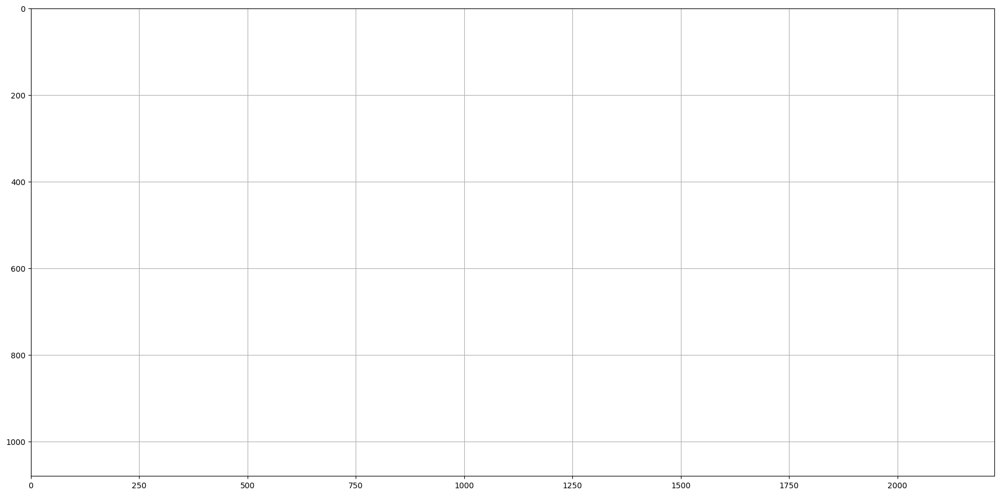

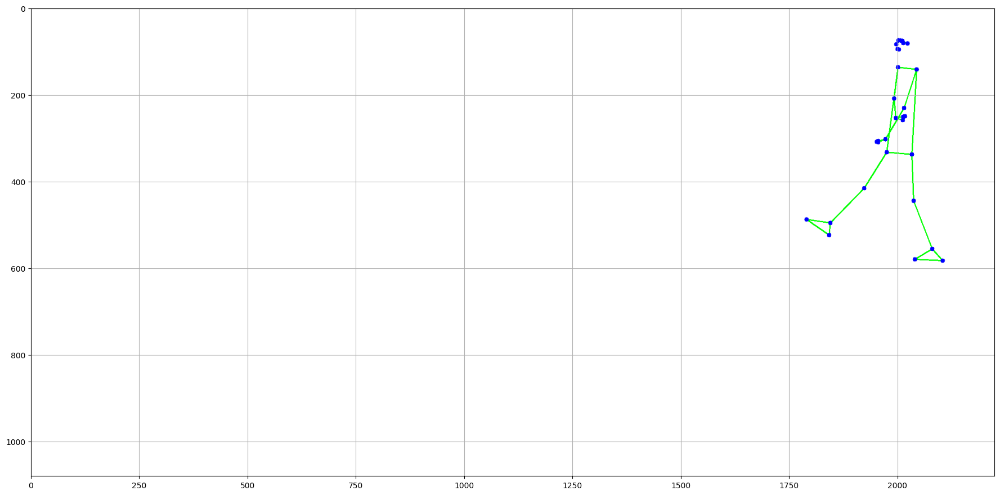

Processing frames:   4%|▍         | 144/3603 [00:13<17:57,  3.21it/s]

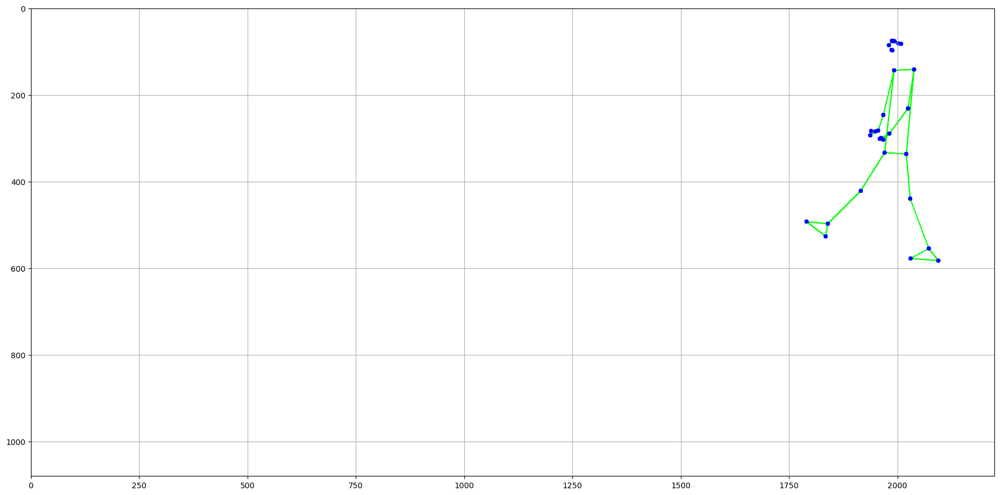

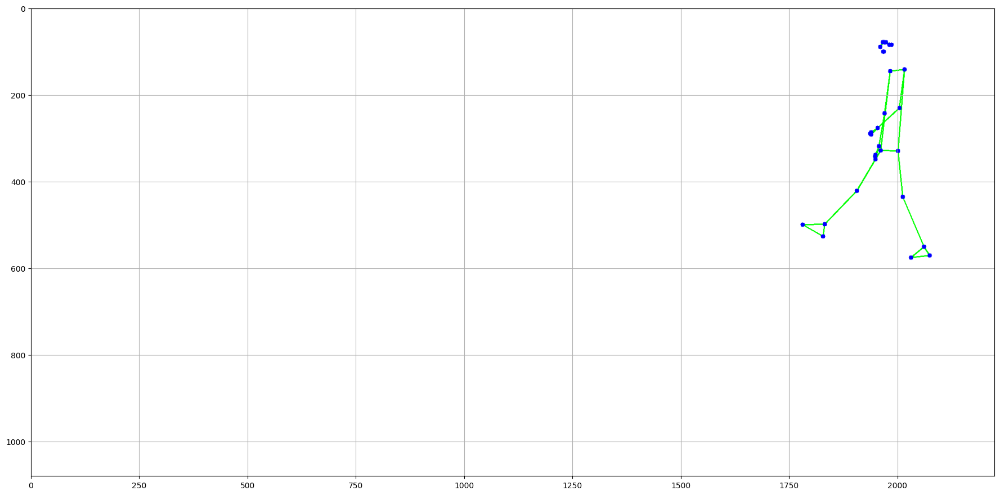

Processing frames:   4%|▍         | 146/3603 [00:15<28:16,  2.04it/s]

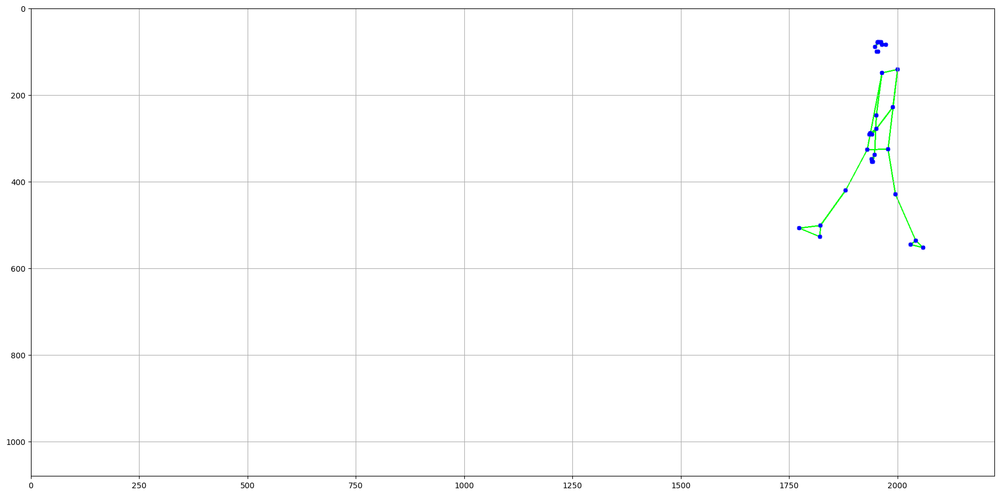

Processing frames:   4%|▍         | 147/3603 [00:16<32:33,  1.77it/s]

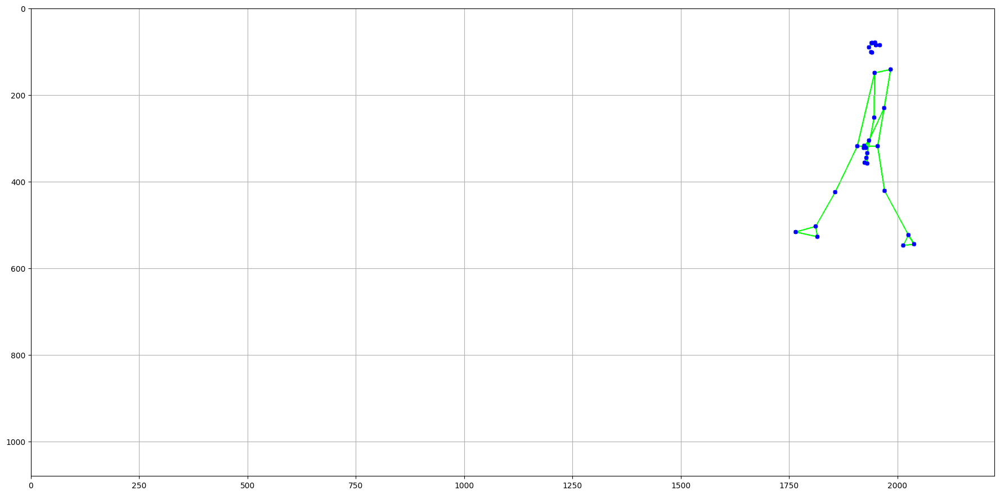

Processing frames: 100%|██████████| 3603/3603 [08:52<00:00,  6.76it/s]


Координаты точек сохранены в 'landmarks_coordinates.csv'


In [ ]:
#@title с камеры 1 (142 - 147 кадр) с привязкой к изображению и сохранение координат
pose_detection_video(video_output_1,"pose_landmarker_heavy.task",0.5,0.5,0.5)

Processing frames:  47%|████▋     | 1670/3589 [02:28<06:51,  4.67it/s]

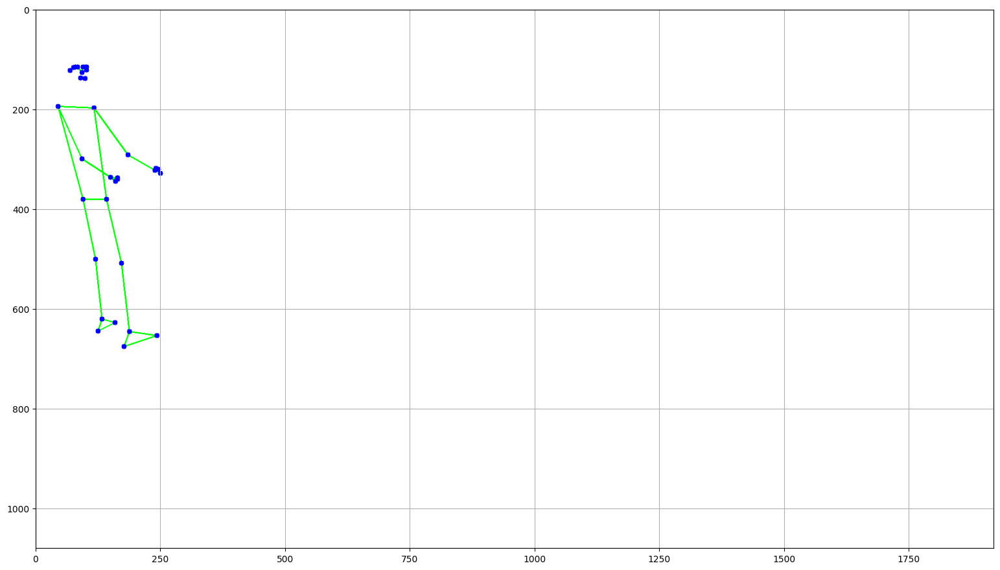

Processing frames:  47%|████▋     | 1671/3589 [02:29<17:09,  1.86it/s]

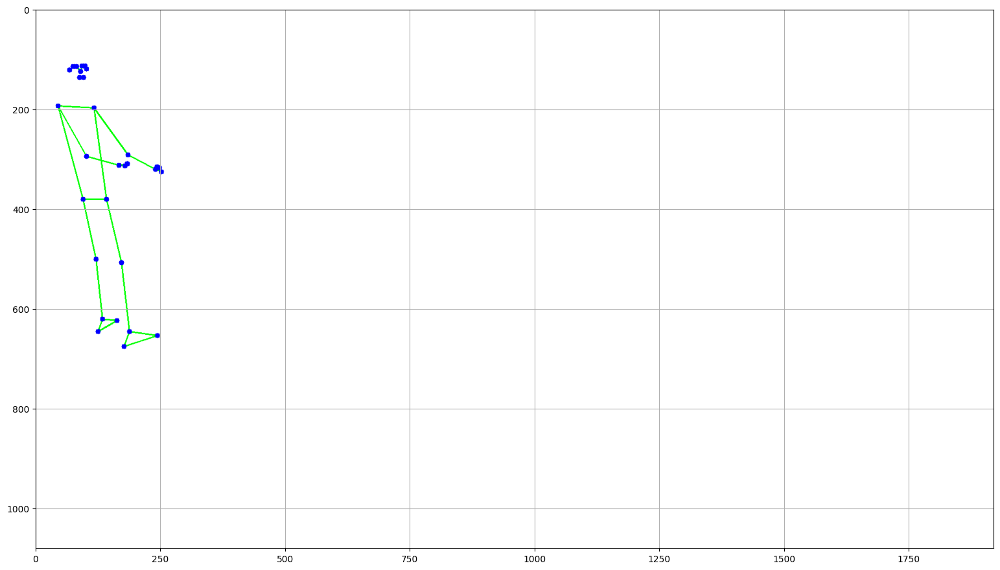

Processing frames:  47%|████▋     | 1672/3589 [02:31<24:10,  1.32it/s]

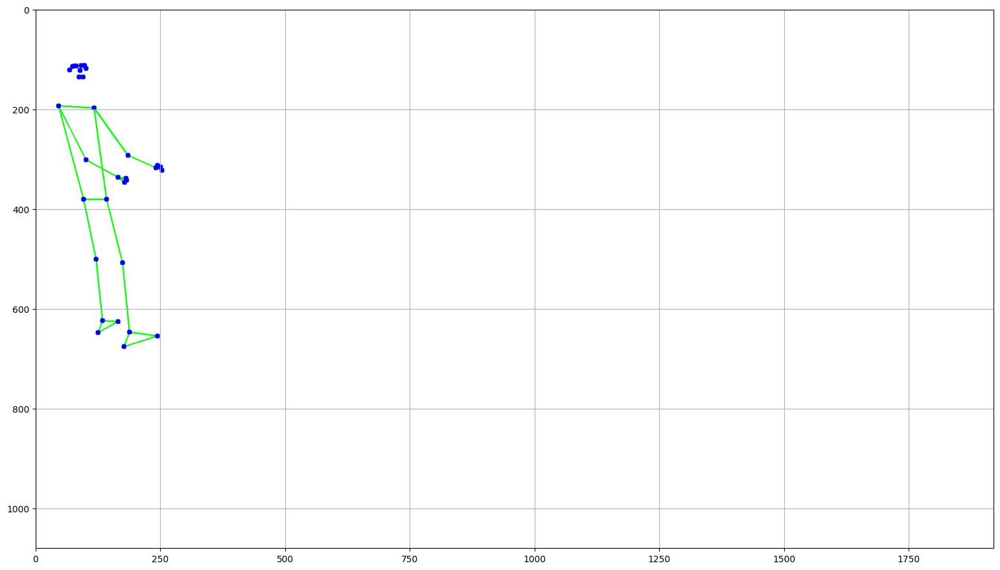

Processing frames:  47%|████▋     | 1673/3589 [02:32<28:42,  1.11it/s]

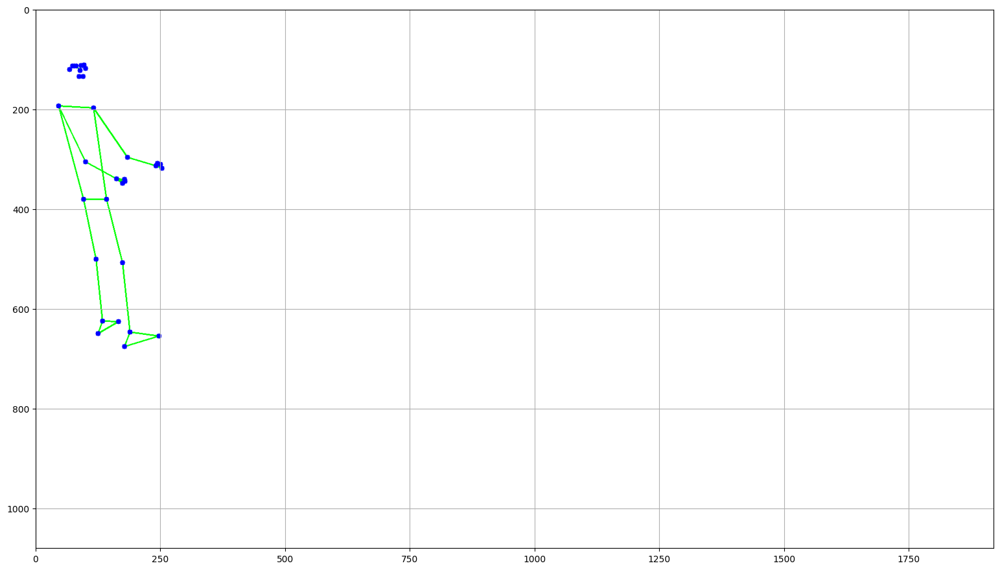

Processing frames:  47%|████▋     | 1674/3589 [02:33<30:02,  1.06it/s]

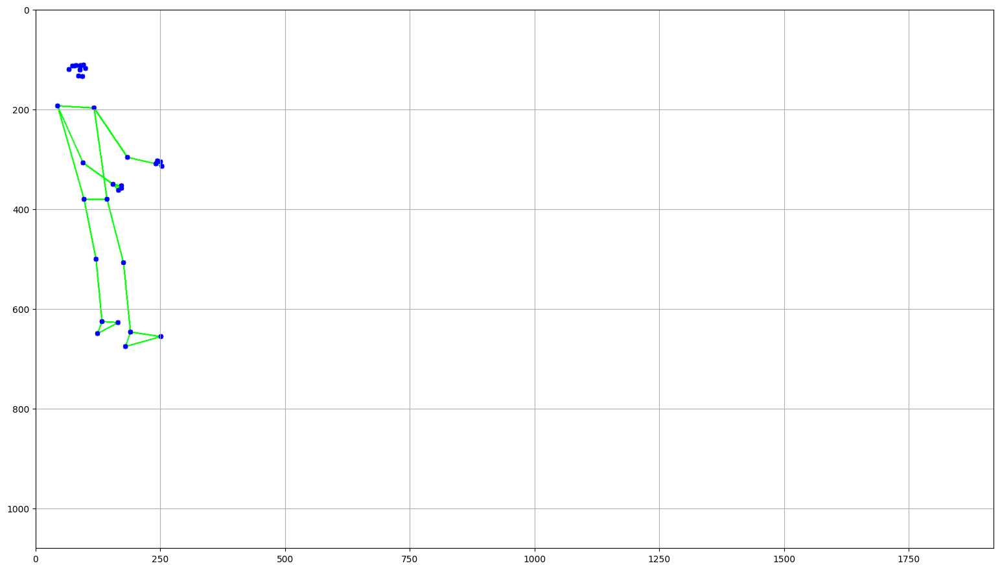

Processing frames:  47%|████▋     | 1675/3589 [02:34<28:54,  1.10it/s]

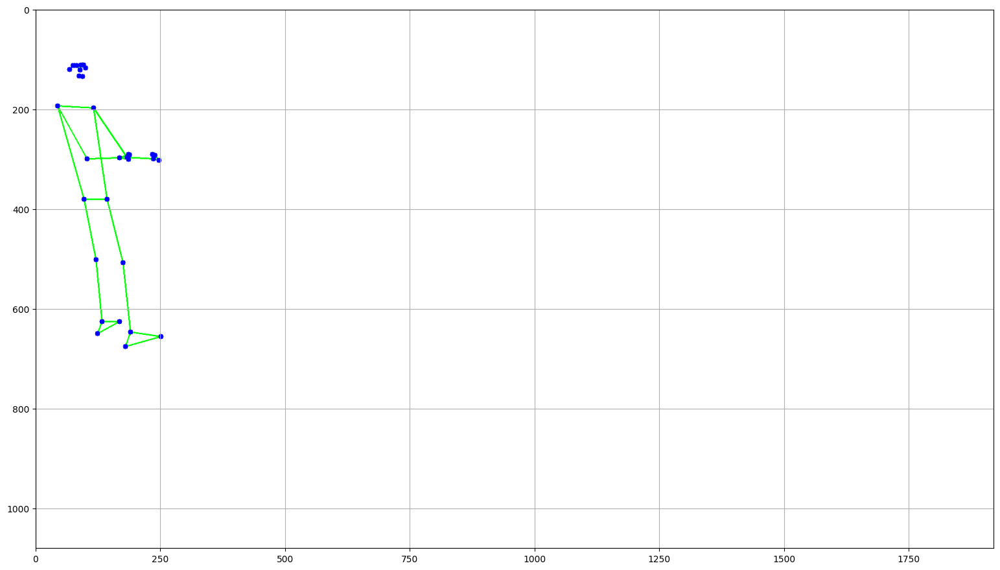

Processing frames: 100%|██████████| 3589/3589 [08:25<00:00,  7.10it/s]


Координаты точек сохранены в 'landmarks_coordinates.csv'


In [ ]:
#@title с камеры 4 (1670 - 1675 кадр) с привязкой к изображению и сохранение координат
pose_detection_video(video_output_4,"pose_landmarker_heavy.task",0.5,0.5,0.5)

In [ ]:
landmarks_df = pd.read_csv('landmarks_coordinates.csv')

In [ ]:
#Позы с камеры №1
landmarks_df

,frame,landmark_id,x,y
0,143,0,1996,84
1,143,1,2001,75
2,143,2,2002,75
3,143,3,2002,75
4,143,4,2005,75
...,...,...,...,...
59494,3602,28,1664,464
59495,3602,29,1637,494
59496,3602,30,1667,483
59497,3602,31,1582,487


#Определение ключевых точек на изображениях

In [ ]:
# Функция для получения информации о кодеке с помощью ffprobe
def get_video_codec(video_path):
    command = [
        'ffprobe',
        '-v', 'error',
        '-select_streams', 'v:0',
        '-show_entries', 'stream=codec_name',
        '-of', 'json',
        video_path
    ]
    result = subprocess.run(command, stdout=subprocess.PIPE, stderr=subprocess.PIPE)
    info = json.loads(result.stdout)
    codec = info['streams'][0]['codec_name'] if 'streams' in info and len(info['streams']) > 0 else 'Unknown'
    return codec

# Функция для вывода информации о видео
def print_video_info(video_paths):
    for video_path in video_paths:
        with VideoFileClip(video_path) as video:
            codec = get_video_codec(video_path)
            print(f"Video: {video_path}")
            print(f"  Duration: {video.duration} seconds")
            print(f"  FPS: {video.fps}")
            print(f"  Resolution: {video.size[0]}x{video.size[1]}")
            print(f"  Codec: {codec}")
            print()

# Вызов функции
print_video_info(output_video_list)

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_1_120s_ffmpeg.mp4
  Duration: 120.03 seconds
  FPS: 30.0
  Resolution: 2224x1080
  Codec: h264

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_2_120s_ffmpeg.mp4
  Duration: 120.0 seconds
  FPS: 29.83
  Resolution: 1920x1080
  Codec: h264

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_3_120s_ffmpeg.mp4
  Duration: 120.02 seconds
  FPS: 30.0
  Resolution: 1920x1080
  Codec: h264

Video: /content/drive/My Drive/video/HEIAN_NIDAN_camera_4_120s_ffmpeg.mp4
  Duration: 120.02 seconds
  FPS: 30.0
  Resolution: 1920x1080
  Codec: h264



In [ ]:
#@title 9 точек
points = [
    [
        [1605,490],
        [1855,390],
        [840,490],
        [1220,400],
        [1480,330],
        [1680,280],
        [600,410],
        [945,345],
        [1210,290]
    ],
    [
        [1335,190],
        [1040,145],
        [1470,370],
        [1040,270],
        [745,215],
        [530,160],
        [1065,525],
        [645,380],
        [370,290]
    ],
    [
        [880,280],
        [570,335],
        [1375,285],
        [1120,345],
        [775,425],
        [300,535],
        [1720,360],
        [1475,440],
        [1115,565]
    ],
    [
        [245,650],
        [750,780],
        [370,430],
        [720,490],
        [1190,570],
        [1880,670],
        [700,340],
        [1040,380],
        [1470,430]
    ]
]


In [ ]:
# Пример цикла для доступа к каждому массиву
for i, cam_points in enumerate(points):
    print(f"Points from camera {i + 1}:")
    for point in cam_points:
        print(point)

Points from camera 1:
[1605, 490]
[1855, 390]
[840, 490]
[1220, 400]
[1480, 330]
[1680, 280]
[600, 410]
[945, 345]
[1210, 290]
Points from camera 2:
[1335, 190]
[1040, 145]
[1470, 370]
[1040, 270]
[745, 215]
[530, 160]
[1065, 525]
[645, 380]
[370, 290]
Points from camera 3:
[880, 280]
[570, 335]
[1375, 285]
[1120, 345]
[775, 425]
[300, 535]
[1720, 360]
[1475, 440]
[1115, 565]
Points from camera 4:
[245, 650]
[750, 780]
[370, 430]
[720, 490]
[1190, 570]
[1880, 670]
[700, 340]
[1040, 380]
[1470, 430]


In [ ]:
from google.colab.patches import cv2_imshow  # Импортируем cv2_imshow
import numpy as np

def draw_grid(image, step=50):
    """Функция для рисования сетки на изображении с подписями."""
    h, w, _ = image.shape
    # Рисуем вертикальные линии и добавляем подписи
    for x in range(0, w, step):
        cv2.line(image, (x, 0), (x, h), (200, 200, 200), 1)  # Серые вертикальные линии
        cv2.putText(image, str(x), (x + 5, 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

    # Рисуем горизонтальные линии и добавляем подписи
    for y in range(0, h, step):
        cv2.line(image, (0, y), (w, y), (200, 200, 200), 1)  # Серые горизонтальные линии
        cv2.putText(image, str(y), (5, y + 15), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

def draw_points(image, points):
    """Функция для рисования точек на изображении."""
    for point in points:
        cv2.circle(image, tuple(point), 5, (0, 0, 255), -1)  # Рисуем красные круги радиусом 5
        # Добавляем текст с координатами
        cv2.putText(image, f'({point[0]}, {point[1]})', (point[0] + 10, point[1]),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)

def frame_view(video_path, frame_num, points=None):
    # Открываем видеофайл
    cap = cv2.VideoCapture(video_path)

    # Проверяем, удалось ли открыть видео
    if not cap.isOpened():
        print(f"Ошибка: Не удалось открыть видео {video_path}.")
    else:
        total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
        print(f"Общее количество кадров в видео {video_path} : {total_frames}")

        # Устанавливаем номер кадра
        cap.set(cv2.CAP_PROP_POS_FRAMES, frame_num)

        # Читаем кадр
        ret, frame = cap.read()

        if ret:
            # Наносим сетку на кадр
            draw_grid(frame, step=50)

            # Если точки не переданы, используем значения по умолчанию
            if points is None:
                points = [
                    [1740, 255],
                    [1040, 145],
                    [1070, 520],
                    [370, 290]
                ]

            # Рисуем точки на кадре
            draw_points(frame, points)

            # Отображаем кадр
            cv2_imshow(frame)  # Используем cv2_imshow вместо cv2.imshow
            #cv2.waitKey(0)  # Ожидаем нажатия клавиши, чтобы закрыть окно

            # Сохраняем кадр как изображение
            output_path = f'{video_path}frame_{frame_num}.jpg'  # Убедитесь, что video_path заканчивается на '/'
            cv2.imwrite(output_path, frame)
            print("Кадр {} сохранен как '{}'.".format(frame_num, output_path))
        else:
            print("Ошибка: Не удалось прочитать кадр.")

Points from camera 1:
[[1605, 490], [1855, 390], [840, 490], [1220, 400], [1480, 330], [1680, 280], [600, 410], [945, 345], [1210, 290]]
Общее количество кадров в видео /content/drive/My Drive/video/HEIAN_NIDAN_camera_1_120s_ffmpeg.mp4 : 3603


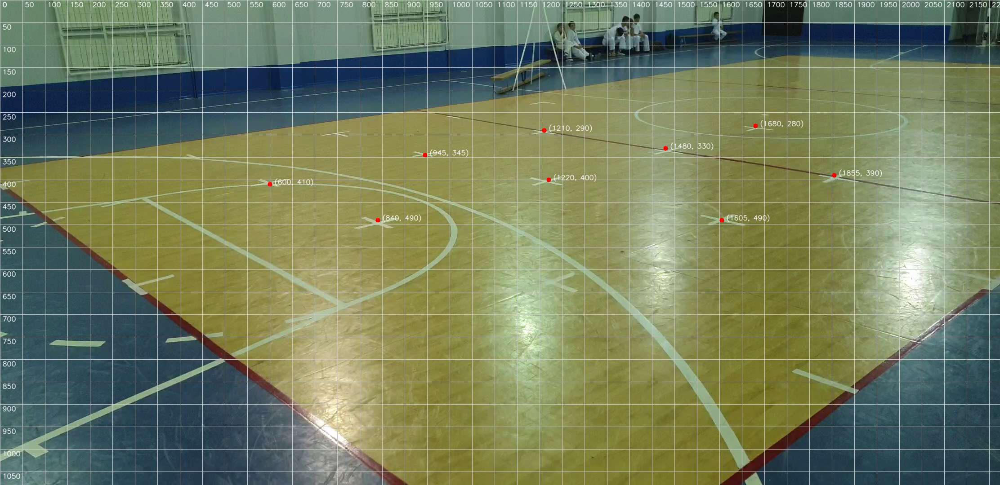

Кадр 1 сохранен как '/content/drive/My Drive/video/HEIAN_NIDAN_camera_1_120s_ffmpeg.mp4frame_1.jpg'.
Points from camera 2:
[[1335, 190], [1040, 145], [1470, 370], [1040, 270], [745, 215], [530, 160], [1065, 525], [645, 380], [370, 290]]
Общее количество кадров в видео /content/drive/My Drive/video/HEIAN_NIDAN_camera_2_120s_ffmpeg.mp4 : 3576


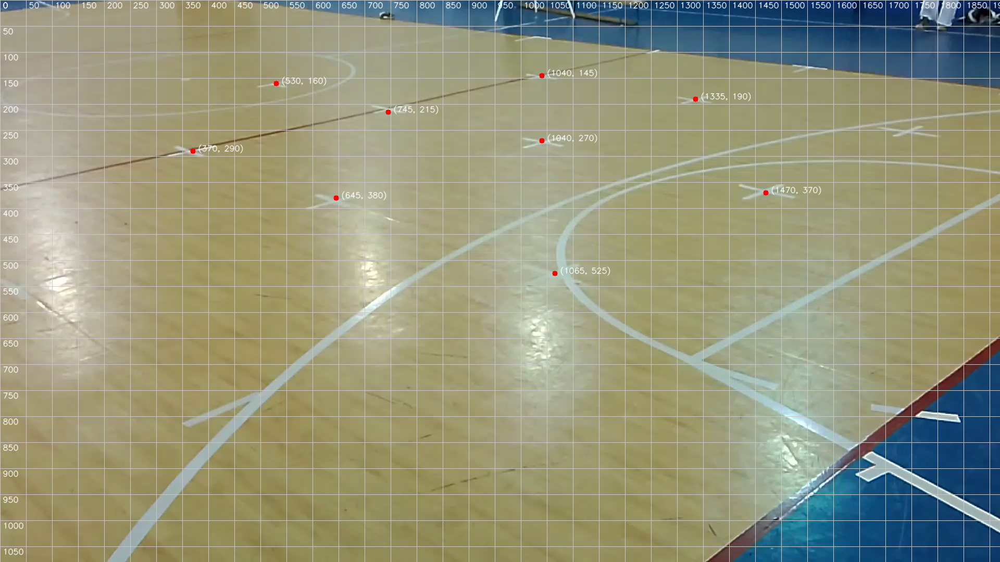

Кадр 1 сохранен как '/content/drive/My Drive/video/HEIAN_NIDAN_camera_2_120s_ffmpeg.mp4frame_1.jpg'.
Points from camera 3:
[[880, 280], [570, 335], [1375, 285], [1120, 345], [775, 425], [300, 535], [1720, 360], [1475, 440], [1115, 565]]
Общее количество кадров в видео /content/drive/My Drive/video/HEIAN_NIDAN_camera_3_120s_ffmpeg.mp4 : 3601


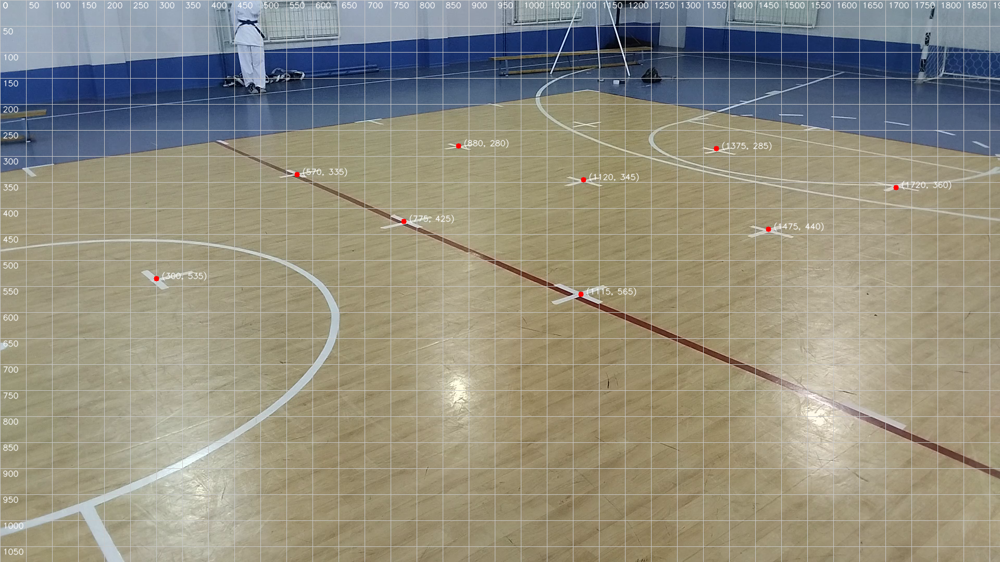

Кадр 1 сохранен как '/content/drive/My Drive/video/HEIAN_NIDAN_camera_3_120s_ffmpeg.mp4frame_1.jpg'.
Points from camera 4:
[[245, 650], [750, 780], [370, 430], [720, 490], [1190, 570], [1880, 670], [700, 340], [1040, 380], [1470, 430]]
Общее количество кадров в видео /content/drive/My Drive/video/HEIAN_NIDAN_camera_4_120s_ffmpeg.mp4 : 3589


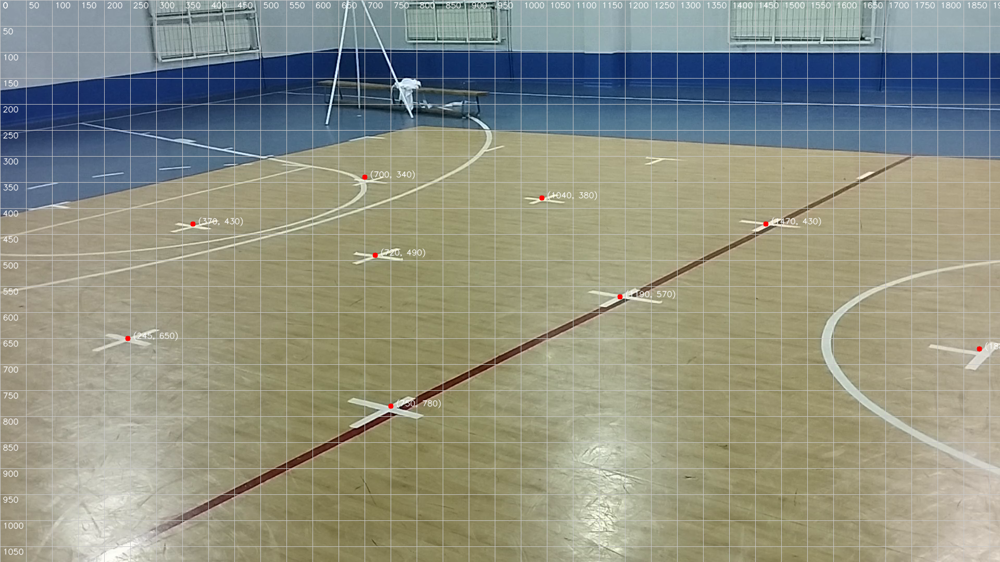

Кадр 1 сохранен как '/content/drive/My Drive/video/HEIAN_NIDAN_camera_4_120s_ffmpeg.mp4frame_1.jpg'.


In [ ]:
# Отрисовка точек на изображениях
for i, cam_points in enumerate(points):
    print(f"Points from camera {i + 1}:")
    points_from_camera = []  # Создаем переменную для хранения точек камеры
    for point in cam_points:
        points_from_camera.append(point)  # Добавляем каждую точку в список
    print(points_from_camera)
    frame_view(output_video_list[i], 1, points=points_from_camera)

Лучшее фокусное расстояние: 1673
Минимальная ошибка: 5.711435
Лучшая матрица проекции:
 [[ 1.94018531e+03 -3.38531293e+02 -3.95664683e+02 -1.23965195e+06]
 [-4.55337258e+01  1.91301505e+01 -1.75729614e+03  3.19240731e+06]
 [ 6.32151735e-01  7.07494354e-01 -3.15968230e-01 -1.15836903e+03]]


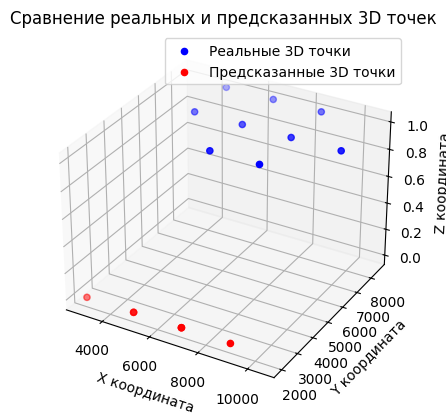

In [ ]:
#@title Получение матрицы проекции для камеры 1 при сравнивании 2D точек....

import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Размеры изображения
height_1 = 1080
width_1 = 2224

# 2D координаты точек
points_2d = np.array([
    [1605, 490],
    [1855, 390],
    [840, 490],
    [1220, 400],
    [1480, 330],
    [1680, 280],
    [600, 410],
    [945, 345],
    [1210, 290]
], dtype=np.float32)

# 3D координаты точек
known_points_3d = np.array([
    [6500, 4500, 1],
    [8500, 4500, 1],
    [4500, 6500, 1],
    [6500, 6500, 1],
    [8500, 6500, 1],
    [10500, 6500, 1],
    [4500, 8500, 1],
    [6500, 8500, 1],
    [8500, 8500, 1]
], dtype=np.float32)


# Списки для хранения ошибок и фокусных расстояний
errors = []
focal_lengths = []

# Параметры для поиска минимальной ошибки
min_error = float('inf')
best_f = None
best_P = None  # Для хранения лучшей матрицы проекции

# Перебор фокусного расстояния от 10 до 3000
for f in range(1000, 2001, 1):  # Шаг 1 для более точного поиска
    c_x = width_1 / 2
    c_y = height_1 / 2

    # Матрица внутренней калибровки
    K = np.array([[f, 0, c_x],
                  [0, f, c_y],
                  [0, 0, 1]])

    # Позиция камеры
    cam_1 = np.array([0, 0, 1800])

    # Используем cv2.solvePnP для нахождения матрицы проекции
    success, rvec, tvec = cv2.solvePnP(known_points_3d, points_2d, K, None)

    if success:
        # Получаем матрицу вращения
        R, _ = cv2.Rodrigues(rvec)

        # Формируем матрицу проекции
        P_1 = K @ np.hstack((R, tvec))

        # Проецируем 3D точки обратно в 2D
        projected_points, _ = cv2.projectPoints(known_points_3d, rvec, tvec, K, None)

        # Вычисляем среднеквадратичную ошибку
        error = np.mean(np.square(projected_points.reshape(-1, 2) - points_2d))

        # Сохраняем значения ошибок и фокусных расстояний
        errors.append(error)
        focal_lengths.append(f)

        # Сохраняем минимальную ошибку и соответствующее фокусное расстояние
        if error < min_error:
            min_error = error
            best_f = f
            best_P = P_1  # Сохраняем лучшую матрицу проекции

print("Лучшее фокусное расстояние:", best_f)
print("Минимальная ошибка:", min_error)
print("Лучшая матрица проекции:\n", best_P)

# Визуализация 3D точек
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Реальные 3D точки
ax.scatter(known_points_3d[:, 0], known_points_3d[:, 1], known_points_3d[:, 2], color='b', label='Реальные 3D точки')

# Предсказанные 3D точки
#predicted_points = known_points_3d.copy()
predicted_points[:, 2] = 0  # Установим Z координату в 0 для визуализации
ax.scatter(predicted_points[:, 0], predicted_points[:, 1], predicted_points[:, 2], color='r', label='Предсказанные 3D точки')

# Настройки графика
ax.set_xlabel('X координата')
ax.set_ylabel('Y координата')
ax.set_zlabel('Z координата')
ax.set_title('Сравнение реальных и предсказанных 3D точек')
ax.legend()

plt.show()

In [ ]:
projected_points

array([[[1597.3059 ,  483.3386 ]],

       [[1852.2479 ,  392.5663 ]],

       [[ 856.33136,  492.89218]],

       [[1216.1477 ,  401.64252]],

       [[1484.8447 ,  333.5008 ]],

       [[1693.1447 ,  280.67578]],

       [[ 592.64264,  410.539  ]],

       [[ 937.2776 ,  341.8705 ]],

       [[1205.0424 ,  288.5184 ]]], dtype=float32)

In [ ]:
points_2d

array([[1605.,  490.],
       [1855.,  390.],
       [ 840.,  490.],
       [1220.,  400.],
       [1480.,  330.],
       [1680.,  280.],
       [ 600.,  410.],
       [ 945.,  345.],
       [1210.,  290.]], dtype=float32)

In [ ]:
P_1 = best_P

In [ ]:
P_1

array([[ 1.94018531e+03, -3.38531293e+02, -3.95664683e+02,
        -1.23965195e+06],
       [-4.55337258e+01,  1.91301505e+01, -1.75729614e+03,
         3.19240731e+06],
       [ 6.32151735e-01,  7.07494354e-01, -3.15968230e-01,
        -1.15836903e+03]])

In [ ]:
import numpy as np
import cv2

# Ваши 2D и 3D точки
points_2d = np.array([
    [1605, 490],
    [1855, 390],
    [840, 490],
    [1220, 400],
    [1480, 330],
    [1680, 280],
    [600, 410],
    [945, 345],
    [1210, 290]
], dtype=np.float32)

known_points_3d = np.array([
    [6500, 4500, 1],
    [8500, 4500, 1],
    [4500, 6500, 1],
    [6500, 6500, 1],
    [8500, 6500, 1],
    [10500, 6500, 1],
    [4500, 8500, 1],
    [6500, 8500, 1],
    [8500, 8500, 1]
], dtype=np.float32)

# Получаем матрицу проекции P_1 (как в вашем коде)
# Здесь предполагается, что вы уже получили best_P
# best_P = P_1

# Теперь мы можем восстановить 3D точки из 2D
def reconstruct_3d(points_2d, P):
    # Преобразуем 2D точки в однородные координаты
    points_2d_homogeneous = np.hstack((points_2d, np.ones((points_2d.shape[0], 1))))

    # Инициализируем список для хранения 3D точек
    points_3d = []

    for point in points_2d_homogeneous:
        # Решаем систему уравнений P * X = 0
        A = np.zeros((4, 4))
        A[0] = point[0] * P[2] - P[0]
        A[1] = point[1] * P[2] - P[1]
        A[2] = P[2]
        A[3] = np.array([0, 0, 0, 1])  # Добавляем уравнение для однородных координат

        # Находим сингулярное разложение
        _, _, Vt = np.linalg.svd(A)
        X = Vt[-1]  # Последний вектор Vt соответствует минимальному собственному значению

        # Нормализуем
        points_3d.append(X[:3] / X[3])  # Возвращаем только первые три координаты

    return np.array(points_3d)

# Восстанавливаем 3D точки
reconstructed_points_3d = reconstruct_3d(points_2d, best_P)

print("Восстановленные 3D точки:\n", reconstructed_points_3d)

Восстановленные 3D точки:
 [[1238.59806035 1334.06279461 1799.08780874]
 [1238.59810326 1334.06278697 1799.08781365]
 [1238.59799852 1334.06285346 1799.08781041]
 [1238.59804484 1334.06283904 1799.08781465]
 [1238.59808191 1334.06282755 1799.08781915]
 [1238.59811193 1334.06281639 1799.08782292]
 [1238.59798799 1334.06288963 1799.0878156 ]
 [1238.59802852 1334.06287299 1799.08781949]
 [1238.59806334 1334.06285886 1799.08782348]]


In [ ]:
# Проецируем восстановленные 3D точки обратно на 2D
def project_points(points_3d, P):
    points_3d_homogeneous = np.hstack((points_3d, np.ones((points_3d.shape[0], 1))))
    projected_points = P @ points_3d_homogeneous.T
    projected_points /= projected_points[2, :]  # Нормализация
    return projected_points[:2, :].T

# Проецируем восстановленные 3D точки
projected_2d_points = project_points(reconstructed_points_3d, best_P)

print("Проецированные 2D точки:\n", projected_2d_points)

Проецированные 2D точки:
 [[1604.99658054  489.99815743]
 [1854.99841328  389.99586469]
 [ 839.99695134  490.00187111]
 [1219.99886222  400.00313464]
 [1479.99985385  330.00080864]
 [1680.00057621  280.00127181]
 [ 599.99788034  410.00266793]
 [ 944.99895842  345.00431818]
 [1210.00056394  289.99866485]]


In [ ]:
best_P

array([[ 1.94018531e+03, -3.38531293e+02, -3.95664683e+02,
        -1.23965195e+06],
       [-4.55337258e+01,  1.91301505e+01, -1.75729614e+03,
         3.19240731e+06],
       [ 6.32151735e-01,  7.07494354e-01, -3.15968230e-01,
        -1.15836903e+03]])

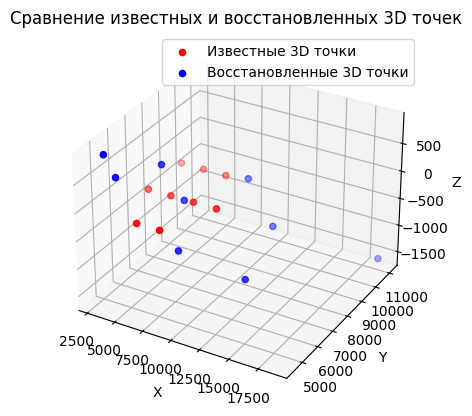

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

points_2d = np.array([
    [1605, 490],
    [1855, 390],
    [840, 490],
    [1220, 400],
    [1480, 330],
    [1680, 280],
    [600, 410],
    [945, 345],
    [1210, 290]
], dtype=np.float32)

# Функция для триангуляции 2D точек в 3D
def triangulate_points(points_2d, P):
    points_4d = []
    for point in points_2d:
        # Создаем однородные координаты
        point_homogeneous = np.array([point[0], point[1], 1])
        # Находим 3D точку
        # Используем псевдообратную матрицу для решения системы уравнений
        A = np.array([
            point_homogeneous[0] * P[2, :] - P[0, :],
            point_homogeneous[1] * P[2, :] - P[1, :]
        ])
        _, _, Vt = np.linalg.svd(A)
        point_3d = Vt[-1]
        points_4d.append(point_3d / point_3d[3])  # Нормализуем
    return np.array(points_4d)

# Восстанавливаем 3D точки
recovered_points_3d = triangulate_points(points_2d, best_P)

# Визуализация 3D точек
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Известные 3D точки
known_x = known_points_3d[:, 0]
known_y = known_points_3d[:, 1]
known_z = known_points_3d[:, 2]

# Восстановленные 3D точки
recovered_x = recovered_points_3d[:, 0]
recovered_y = recovered_points_3d[:, 1]
recovered_z = recovered_points_3d[:, 2]

# Отображение известных 3D точек
ax.scatter(known_x, known_y, known_z, color='r', label='Известные 3D точки')

# Отображение восстановленных 3D точек
ax.scatter(recovered_x, recovered_y, recovered_z, color='b', label='Восстановленные 3D точки')

# Настройка графика
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()
plt.title('Сравнение известных и восстановленных 3D точек')
plt.show()

In [ ]:
print(recovered_points_3d)

[[ 8.38584297e+03  5.63560292e+03 -6.64772424e+02  1.00000000e+00]
 [ 1.30194632e+04  6.47504262e+03 -1.11452150e+03  1.00000000e+00]
 [ 3.66362377e+03  5.18234160e+03  4.74848530e+02  1.00000000e+00]
 [ 7.00243112e+03  6.95762928e+03 -1.65321518e+02  1.00000000e+00]
 [ 1.20073483e+04  9.00394626e+03 -8.51079303e+02  1.00000000e+00]
 [ 1.87347175e+04  1.10960402e+04 -1.58089763e+03  1.00000000e+00]
 [ 2.91719151e+03  5.01839685e+03  8.71588042e+02  1.00000000e+00]
 [ 5.24602603e+03  6.81106663e+03  4.10650033e+02  1.00000000e+00]
 [ 9.34892433e+03  9.33566691e+03 -2.08971580e+02  1.00000000e+00]]


Лучшее фокусное расстояние: 2085
Минимальная ошибка: 40.738033
Лучшая матрица проекции:
 [[ 1.14934829e+03  2.03120617e+03 -3.70093214e+02 -1.52455308e+07]
 [-1.43316585e+01 -8.83531845e+01 -2.15193246e+03  4.32023911e+06]
 [-5.33307986e-01  7.98182121e-01 -2.80156908e-01  5.77605547e+03]]


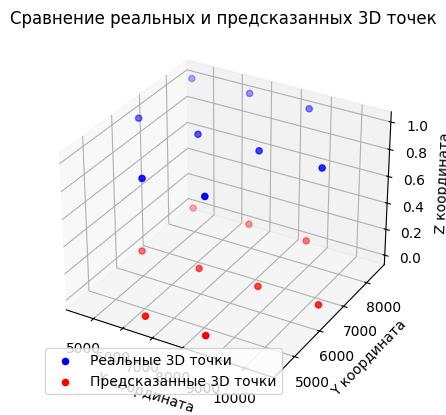

In [ ]:
#@title Получение матрицы проекции для камеры 4 при сравнивании 2D точек....

import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Размеры изображения
height_4 = 1080
width_4 = 1920

# 2D координаты точек
points_2d = np.array([
        [245,650],
        [750,780],
        [370,430],
        [720,490],
        [1190,570],
        [1880,670],
        [700,340],
        [1040,380],
        [1470,430]
], dtype=np.float32)

# 3D координаты точек
known_points_3d = np.array([
    [6500, 4500, 1],
    [8500, 4500, 1],
    [4500, 6500, 1],
    [6500, 6500, 1],
    [8500, 6500, 1],
    [10500, 6500, 1],
    [4500, 8500, 1],
    [6500, 8500, 1],
    [8500, 8500, 1]
], dtype=np.float32)


# Списки для хранения ошибок и фокусных расстояний
errors = []
focal_lengths = []

# Параметры для поиска минимальной ошибки
min_error = float('inf')
best_f = None
best_P = None  # Для хранения лучшей матрицы проекции

# Перебор фокусного расстояния от 10 до 3000
for f in range(1000, 3001, 1):  # Шаг 1 для более точного поиска
    c_x = width_1 / 2
    c_y = height_1 / 2

    # Матрица внутренней калибровки
    K = np.array([[f, 0, c_x],
                  [0, f, c_y],
                  [0, 0, 1]])

    # Позиция камеры
    cam_1 = np.array([0, 0, 1800])

    # Используем cv2.solvePnP для нахождения матрицы проекции
    success, rvec, tvec = cv2.solvePnP(known_points_3d, points_2d, K, None)

    if success:
        # Получаем матрицу вращения
        R, _ = cv2.Rodrigues(rvec)

        # Формируем матрицу проекции
        P_4 = K @ np.hstack((R, tvec))

        # Проецируем 3D точки обратно в 2D
        projected_points, _ = cv2.projectPoints(known_points_3d, rvec, tvec, K, None)

        # Вычисляем среднеквадратичную ошибку
        error = np.mean(np.square(projected_points.reshape(-1, 2) - points_2d))

        # Сохраняем значения ошибок и фокусных расстояний
        errors.append(error)
        focal_lengths.append(f)

        # Сохраняем минимальную ошибку и соответствующее фокусное расстояние
        if error < min_error:
            min_error = error
            best_f = f
            best_P = P_4  # Сохраняем лучшую матрицу проекции

print("Лучшее фокусное расстояние:", best_f)
print("Минимальная ошибка:", min_error)
print("Лучшая матрица проекции:\n", best_P)

# Визуализация 3D точек
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Реальные 3D точки
ax.scatter(known_points_3d[:, 0], known_points_3d[:, 1], known_points_3d[:, 2], color='b', label='Реальные 3D точки')

# Предсказанные 3D точки
predicted_points = known_points_3d.copy()
predicted_points[:, 2] = 0  # Установим Z координату в 0 для визуализации
ax.scatter(predicted_points[:, 0], predicted_points[:, 1], predicted_points[:, 2], color='r', label='Предсказанные 3D точки')

# Настройки графика
ax.set_xlabel('X координата')
ax.set_ylabel('Y координата')
ax.set_zlabel('Z координата')
ax.set_title('Сравнение реальных и предсказанных 3D точек')
ax.legend()

plt.show()

In [ ]:
P_4 = best_P

In [ ]:
P_4

array([[ 1.14934829e+03,  2.03120617e+03, -3.70093214e+02,
        -1.52455308e+07],
       [-1.43316585e+01, -8.83531845e+01, -2.15193246e+03,
         4.32023911e+06],
       [-5.33307986e-01,  7.98182121e-01, -2.80156908e-01,
         5.77605547e+03]])

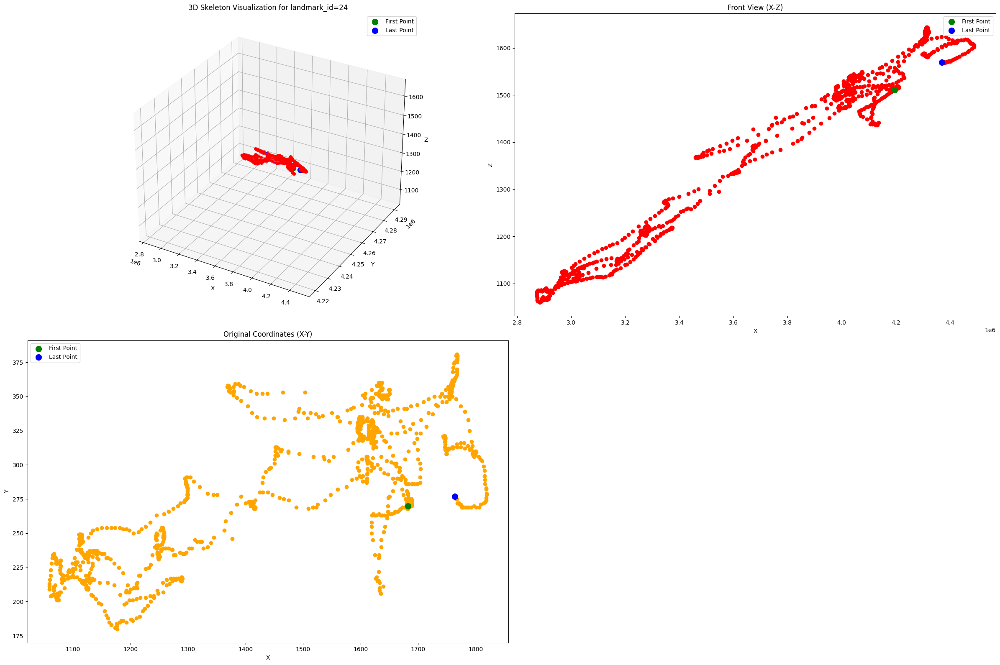

In [ ]:
#@title Визуализация движения 24 точки скелета с камеры 1
import numpy as np
import matplotlib.pyplot as plt

# Фильтрация данных по кадрам с 225 по 1545
landmarks_filtered = landmarks_df[(landmarks_df['frame'] >= 225) & (landmarks_df['frame'] <= 1545)]

# Преобразование отфильтрованных данных в массив numpy
landmarks_2d = np.array(landmarks_filtered)

# Фильтрация данных для landmark_id=24
landmarks_24 = landmarks_2d[landmarks_2d[:, 1] == 24]

# Удаление первых двух столбцов (frame и landmark_id)
landmarks_24_filtered = landmarks_24[:, 2:4]

# Добавление Z координаты (например, 0)
landmarks_2d_with_z = np.hstack((landmarks_24_filtered, np.zeros((landmarks_24_filtered.shape[0], 1))))

# Матрица преобразования (добавляем строку и столбец для однородных координат)
transformation_matrix = P_1

# Добавление единичного столбца для однородных координат
ones = np.ones((landmarks_2d_with_z.shape[0], 1))
landmarks_2d_homogeneous = np.hstack((landmarks_2d_with_z, ones))

# Применение матрицы преобразования
landmarks_3d_homogeneous = landmarks_2d_homogeneous @ transformation_matrix.T

# Извлечение 3D координат
landmarks_3d = landmarks_3d_homogeneous[:, :3]

# Визуализация 3D графика
fig = plt.figure(figsize=(24, 16))  # Увеличение размера графика

# 3D график
ax = fig.add_subplot(221, projection='3d')
ax.scatter(landmarks_3d[:, 0], landmarks_3d[:, 1], landmarks_3d[:, 2], c='r', marker='o')

# Выделение первой и последней точки
ax.scatter(landmarks_3d[0, 0], landmarks_3d[0, 1], landmarks_3d[0, 2], c='g', s=100, label='First Point')
ax.scatter(landmarks_3d[-1, 0], landmarks_3d[-1, 1], landmarks_3d[-1, 2], c='b', s=100, label='Last Point')

# Соединение точек линиями
for i in range(len(landmarks_3d) - 1):
    ax.plot(landmarks_3d[i:i+2, 0], landmarks_3d[i:i+2, 1], landmarks_3d[i:i+2, 2], c='b')

# График изначальных координат X, Y
ax_original = fig.add_subplot(223)
ax_original.scatter(landmarks_24_filtered[:, 0], landmarks_24_filtered[:, 1], c='orange', marker='o')
ax_original.scatter(landmarks_24_filtered[0, 0], landmarks_24_filtered[0, 1], c='g', s=100, label='First Point')
ax_original.scatter(landmarks_24_filtered[-1, 0], landmarks_24_filtered[-1, 1], c='b', s=100, label='Last Point')
ax_original.set_xlabel('X')
ax_original.set_ylabel('Y')
ax_original.set_title('Original Coordinates (X-Y)')
ax_original.legend()

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Skeleton Visualization for landmark_id=24')
ax.legend()

# Вид спереди (X-Z)
ax_front = fig.add_subplot(222)
ax_front.scatter(landmarks_3d[:, 0], landmarks_3d[:, 2], c='r', marker='o')
ax_front.scatter(landmarks_3d[0, 0], landmarks_3d[0, 2], c='g', s=100, label='First Point')
ax_front.scatter(landmarks_3d[-1, 0], landmarks_3d[-1, 2], c='b', s=100, label='Last Point')
ax_front.set_xlabel('X')
ax_front.set_ylabel('Z')
ax_front.set_title('Front View (X-Z)')
ax_front.legend()


'''
# Вид сбоку (Y-Z)
ax_side_yz = fig.add_subplot(224)
ax_side_yz.scatter(landmarks_3d[:, 1], landmarks_3d[:, 2], c='r', marker='o')
ax_side_yz.scatter(landmarks_3d[0, 1], landmarks_3d[0, 2], c='g', s=100, label='First Point')
ax_side_yz.scatter(landmarks_3d[-1, 1], landmarks_3d[-1, 2], c='b', s=100, label='Last Point')
ax_side_yz.set_xlabel('Y')
ax_side_yz.set_ylabel('Z')
ax_side_yz.set_title('Side View (Y-Z)')
ax_side_yz.legend()
'''
plt.tight_layout()
plt.show()

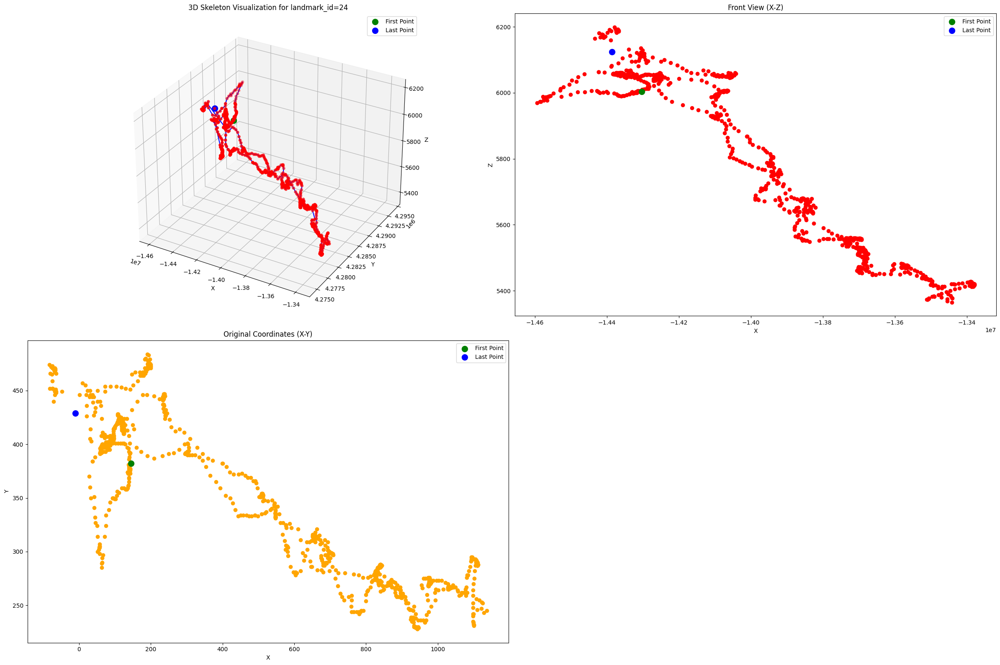

In [ ]:
#@title Визуализация движения 24 точки с камеры 4

landmarks_df = pd.read_csv('landmarks_coordinates_4.csv')

import numpy as np
import matplotlib.pyplot as plt

# Фильтрация данных по кадрам с 1640 по 3030
landmarks_filtered = landmarks_df[(landmarks_df['frame'] >= 1640) & (landmarks_df['frame'] <= 3030)]

# Преобразование отфильтрованных данных в массив numpy
landmarks_2d = np.array(landmarks_filtered)

# Фильтрация данных для landmark_id=24
landmarks_24 = landmarks_2d[landmarks_2d[:, 1] == 24]

# Удаление первых двух столбцов (frame и landmark_id)
landmarks_24_filtered = landmarks_24[:, 2:4]

# Добавление Z координаты (например, 0)
landmarks_2d_with_z = np.hstack((landmarks_24_filtered, np.zeros((landmarks_24_filtered.shape[0], 1))))

# Матрица преобразования (добавляем строку и столбец для однородных координат)
transformation_matrix = P_4

# Добавление единичного столбца для однородных координат
ones = np.ones((landmarks_2d_with_z.shape[0], 1))
landmarks_2d_homogeneous = np.hstack((landmarks_2d_with_z, ones))

# Применение матрицы преобразования
landmarks_3d_homogeneous = landmarks_2d_homogeneous @ transformation_matrix.T

# Извлечение 3D координат
landmarks_3d = landmarks_3d_homogeneous[:, :3]

# Визуализация 3D графика
fig = plt.figure(figsize=(24, 16))  # Увеличение размера графика

# 3D график
ax = fig.add_subplot(221, projection='3d')
ax.scatter(landmarks_3d[:, 0], landmarks_3d[:, 1], landmarks_3d[:, 2], c='r', marker='o')

# Выделение первой и последней точки
ax.scatter(landmarks_3d[0, 0], landmarks_3d[0, 1], landmarks_3d[0, 2], c='g', s=100, label='First Point')
ax.scatter(landmarks_3d[-1, 0], landmarks_3d[-1, 1], landmarks_3d[-1, 2], c='b', s=100, label='Last Point')

# Соединение точек линиями
for i in range(len(landmarks_3d) - 1):
    ax.plot(landmarks_3d[i:i+2, 0], landmarks_3d[i:i+2, 1], landmarks_3d[i:i+2, 2], c='b')

# График изначальных координат X, Y
ax_original = fig.add_subplot(223)
ax_original.scatter(landmarks_24_filtered[:, 0], landmarks_24_filtered[:, 1], c='orange', marker='o')
ax_original.scatter(landmarks_24_filtered[0, 0], landmarks_24_filtered[0, 1], c='g', s=100, label='First Point')
ax_original.scatter(landmarks_24_filtered[-1, 0], landmarks_24_filtered[-1, 1], c='b', s=100, label='Last Point')
ax_original.set_xlabel('X')
ax_original.set_ylabel('Y')
ax_original.set_title('Original Coordinates (X-Y)')
ax_original.legend()

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Skeleton Visualization for landmark_id=24')
ax.legend()

# Вид спереди (X-Z)
ax_front = fig.add_subplot(222)
ax_front.scatter(landmarks_3d[:, 0], landmarks_3d[:, 2], c='r', marker='o')
ax_front.scatter(landmarks_3d[0, 0], landmarks_3d[0, 2], c='g', s=100, label='First Point')
ax_front.scatter(landmarks_3d[-1, 0], landmarks_3d[-1, 2], c='b', s=100, label='Last Point')
ax_front.set_xlabel('X')
ax_front.set_ylabel('Z')
ax_front.set_title('Front View (X-Z)')
ax_front.legend()


'''
# Вид сбоку (Y-Z)
ax_side_yz = fig.add_subplot(224)
ax_side_yz.scatter(landmarks_3d[:, 1], landmarks_3d[:, 2], c='r', marker='o')
ax_side_yz.scatter(landmarks_3d[0, 1], landmarks_3d[0, 2], c='g', s=100, label='First Point')
ax_side_yz.scatter(landmarks_3d[-1, 1], landmarks_3d[-1, 2], c='b', s=100, label='Last Point')
ax_side_yz.set_xlabel('Y')
ax_side_yz.set_ylabel('Z')
ax_side_yz.set_title('Side View (Y-Z)')
ax_side_yz.legend()
'''
plt.tight_layout()
plt.show()

3D координаты точек:
[[ 6.5255986e+03  4.5215464e+03 -1.3217995e+01]
 [ 8.4799434e+03  4.4954761e+03  1.0851521e+01]
 [ 4.5078037e+03  6.5184834e+03  3.4883208e+00]
 [ 6.5069888e+03  6.4727998e+03 -3.8416016e-01]
 [ 8.4740518e+03  6.4790225e+03 -3.3293023e+00]
 [ 1.0524435e+04  6.5140386e+03  2.4486816e+00]
 [ 4.4851821e+03  8.4624180e+03  1.9926863e+01]
 [ 6.4793506e+03  8.5002227e+03 -1.9977015e+00]
 [ 8.5048193e+03  8.5025107e+03 -1.2841077e+00]]
Среднеквадратичное отклонение по координатам (X, Y, Z):
[1887.9045   1466.911       8.783374]


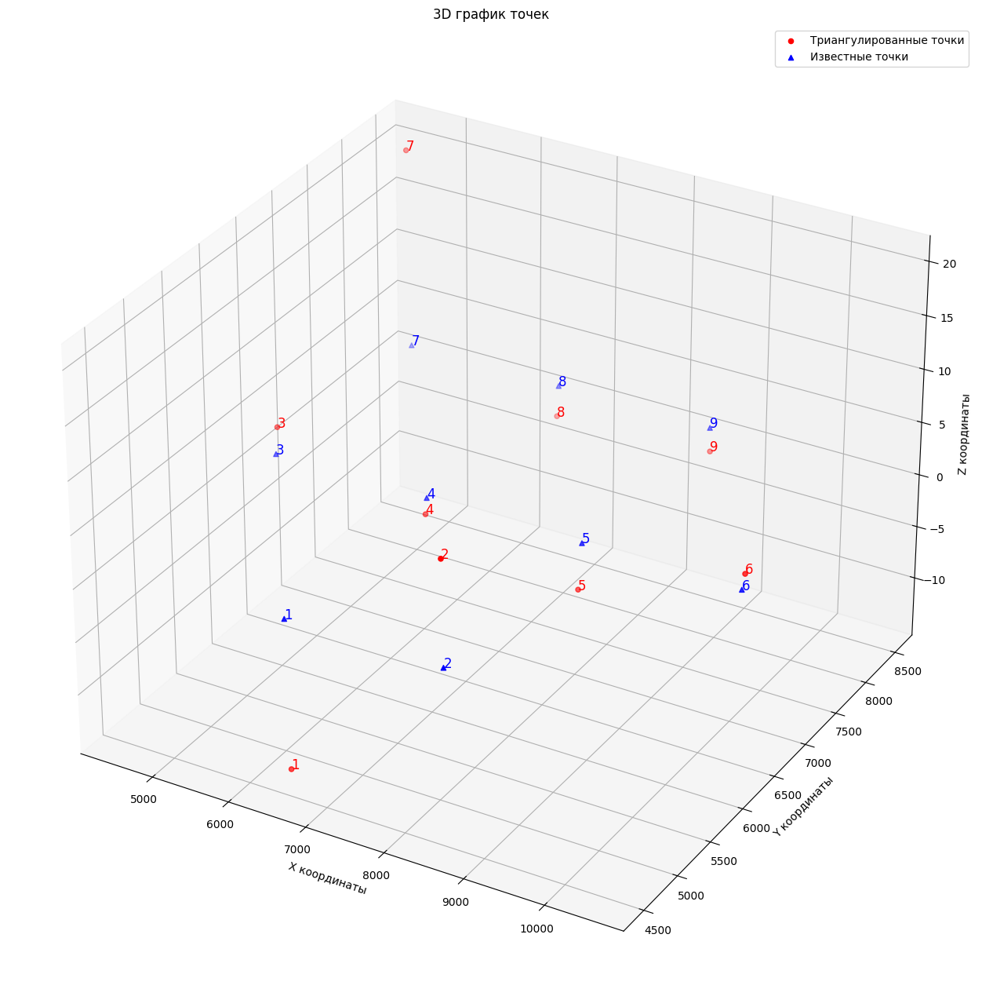

In [ ]:
#@title Проба триангуляции
import numpy as np
import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# 2D координаты точек с камер
points_2d_cam_1 = np.array([
    [1605, 490],
    [1855, 390],
    [840, 490],
    [1220, 400],
    [1480, 330],
    [1680, 280],
    [600, 410],
    [945, 345],
    [1210, 290]
], dtype=np.float32)

points_2d_cam_4 = np.array([
    [245, 650],
    [750, 780],
    [370, 430],
    [720, 490],
    [1190, 570],
    [1880, 670],
    [700, 340],
    [1040, 380],
    [1470, 430]
], dtype=np.float32)

# 3D координаты точек
known_points_3d = np.array([
    [6500, 4500, 1],
    [8500, 4500, 1],
    [4500, 6500, 1],
    [6500, 6500, 1],
    [8500, 6500, 1],
    [10500, 6500, 1],
    [4500, 8500, 1],
    [6500, 8500, 1],
    [8500, 8500, 1]
], dtype=np.float32)

# Матрицы проекции
P1 = np.array([[ 1.94018531e+03, -3.38531293e+02, -3.95664683e+02, -1.23965195e+06],
               [-4.55337258e+01,  1.91301505e+01, -1.75729614e+03,  3.19240731e+06],
               [ 6.32151735e-01,  7.07494354e-01, -3.15968230e-01, -1.15836903e+03]])

P4 = np.array([[ 1.14934829e+03,  2.03120617e+03, -3.70093214e+02, -1.52455308e+07],
               [-1.43316585e+01, -8.83531845e+01, -2.15193246e+03,  4.32023911e+06],
               [-5.33307986e-01,  7.98182121e-01, -2.80156908e-01,  5.77605547e+03]])

# Функция для триангуляции
def triangulate_points(points_2d_1, points_2d_4, P1, P4):
    # Преобразуем 2D точки в гомогенные координаты
    points_2d_1_hom = cv2.convertPointsToHomogeneous(points_2d_1)
    points_2d_4_hom = cv2.convertPointsToHomogeneous(points_2d_4)

    # Проверяем, что количество точек совпадает
    if points_2d_1_hom.shape[0] != points_2d_4_hom.shape[0]:
        raise ValueError("Количество точек из обеих камер должно совпадать.")

    # Триангуляция
    points_3d_hom = cv2.triangulatePoints(P1, P4, points_2d_1_hom[:, 0, :].T[:2], points_2d_4_hom[:, 0, :].T[:2])

    # Преобразуем обратно в 3D координаты
    points_3d = points_3d_hom[:3, :] / points_3d_hom[3, :]

    return points_3d.T

# Выполняем триангуляцию
points_3d = triangulate_points(points_2d_cam_1, points_2d_cam_4, P1, P4)

print("3D координаты точек:")
print(points_3d)

# Вычисляем среднеквадратичное отклонение
std_dev = np.std(points_3d, axis=0)
print("Среднеквадратичное отклонение по координатам (X, Y, Z):")
print(std_dev)

# Визуализация 3D точек
fig = plt.figure(figsize=(24, 16))
ax = fig.add_subplot(111, projection='3d')

# Отображаем триангулированные точки
ax.scatter(points_3d[:, 0], points_3d[:, 1], points_3d[:, 2], c='r', marker='o', label='Триангулированные точки')

# Отображаем известные 3D точки
ax.scatter(known_points_3d[:, 0], known_points_3d[:, 1], known_points_3d[:, 2], c='b', marker='^', label='Известные точки')

# Добавляем нумерацию точек
for i in range(points_3d.shape[0]):
    ax.text(points_3d[i, 0], points_3d[i, 1], points_3d[i, 2], str(i + 1), color='red', fontsize=12)

# Нумерация известных точек, начиная с 1
for i in range(known_points_3d.shape[0]):
    ax.text(known_points_3d[i, 0], known_points_3d[i, 1], known_points_3d[i, 2], str(i + 1), color='blue', fontsize=12)

# Настройка меток осей
ax.set_xlabel('X координаты')
ax.set_ylabel('Y координаты')
ax.set_zlabel('Z координаты')
ax.set_title('3D график точек')
ax.legend()

# Показать график
plt.show()